In [3]:
%tensorflow_version 2.x
%matplotlib inline
import matplotlib.pyplot as plt

import glob, os
import numpy as np
import pandas as pd
# from PIL import Image

from IPython.display import Image

import sys

from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import UpSampling2D, Conv2D, LeakyReLU, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow import test
from tensorflow import device

from keras.utils import plot_model

In [4]:
images_dir = "training_images"
img_rows = 64
img_cols = 64
channels = 1
img_shape = (img_rows, img_cols, channels)

size = 64, 64

noise_len = 100

In [5]:
mugshots = np.load('front_mugshots.npy')  # Uploading the processed grayscale 64x64 mugshots of black males

This was the GAN model I used for the first attempt at the mugshots. I didn't change much from the original, but the commentary below will highlight the parts I did change.

In [35]:
def build_discriminator():
    '''
    Put together a CNN that will return a single confidence output.
    
    returns: the model object
    '''

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

def build_generator():
    '''
    Put together a model that takes in one-dimensional noise and outputs two-dimensional
    data representing a black and white image, with -1 for black and 1 for white.
    
    returns: the model object
    '''

    noise_shape = (noise_len,)

    model = Sequential()

    # The generator had to be changed because the size of the image we are generating is different
    # Instead of a 28 by 28 px image, it's now a 64 by 64 px image
    # Because htis I had to look up what UpSampling2D does, and I found out that it quadruples
    # the area of each pixel by repeating along the length and height
    # https://keras.io/api/layers/reshaping_layers/up_sampling2d/
    # Because there are 2 upsamples here, I had to change the 7 in the first line to 16
    # (7*2*2 = 28, 16*2*2 = 64)
    model.add(Dense(128 * 16 * 16, activation="relu", input_shape=noise_shape))
    model.add(Reshape((16, 16, 128)))
    model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2D(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2D(64, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(1, kernel_size=3, padding="same"))
    model.add(Activation("tanh"))

    return model

def build_combined():
    '''
    Puts together a model that combines the discriminator and generator models.
    
    returns: the generator, discriminator, and combined model objects
    '''
    
    # Nothing much to change here
    optimizer = Adam(0.0002, 0.5)

    discriminator = build_discriminator()
    discriminator.compile(loss='binary_crossentropy', 
                          optimizer=optimizer,
                          metrics=['accuracy'])


    generator = build_generator()

    noise = Input(shape=(noise_len,))
    img = generator(noise)
    
    discriminator.trainable = False

    valid = discriminator(img)

    combined = Model(inputs=noise, outputs=valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator, discriminator, combined

def save_imgs(generator, iteration):
    '''
    Has the generator create images and saves the images in a single file that includes
    the number of iterations in the filename.
    
    inputs:
        generator: the generator model object returned by build_combined
        iteration: the iteration number (but can be anything that can be represented as a string)
    
    returns: None
    '''
    # I made this output a 3 by 3 grid instead of 5 by 5 to allow me to see more details in the mugshots
    r, c = 3, 3
    noise = np.random.normal(0, 1, (r * c, noise_len))
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray', vmin=-1, vmax=1)
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(images_dir, 'mnist_{}.png'.format(iteration)))
    plt.close()

def train(generator, discriminator, combined, dataset, iterations, batch_size=128, save_interval=50):
    '''
    Trains all model objects
    
    generator: the generator model object returned by build_combined
    discriminator: the discriminator model object returned by build_combined
    combined: the combined model object returned by build_combined
    iterations: integer, the number of iterations to train for
    batch_size: integer, the number of training samples to use at a time
    save_interval: integer, will generate and save images when the current iteration_num % save_interval is 0
    
    returns: None
    '''

    # Load the dataset
    #(X_train, _), (_, _) = mnist.load_data()
    
    # Since the mugshots are not loaded by a function, I just let them be an input in the trianing function
    X_train = dataset

    # Nothing else had to be changed here
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    half_batch = int(batch_size / 2)

    for iteration in range(iterations):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

        noise = np.random.normal(0, 1, (half_batch, noise_len))
        gen_imgs = generator.predict(noise)

        real = 1
        fake = 0
        if np.random.randint(0, 10) < 1:
            real = 0
            fake = 1
        d_loss_real = discriminator.train_on_batch(imgs, np.zeros((half_batch, 1)) + real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)) + fake)

        # ---------------------
        #  Train Generator
        # ---------------------

        noise = np.random.normal(0, 1, (batch_size, noise_len))

        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

        if iteration % save_interval == 0:
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            print ("{} [D loss: {}, acc.: {:.2%}] [G loss: {}]".format(iteration, d_loss[0], d_loss[1], g_loss))
            save_imgs(generator, iteration)
            
def show_new_image(generator):
    '''
    Generates and displays a new image
    
    inputs: generator object model returned from build_combined
    
    returns: generated image
    '''
    
    # No changes
    noise = np.random.normal(0, 1, (1, noise_len))
    gen_img = generator.predict(noise)[0][:,:,0]
    
    return plt.imshow(gen_img, cmap='gray', vmin=-1, vmax=1)

In [10]:
if (not os.path.isdir(images_dir)):
    os.mkdir(images_dir)

In [6]:
generator, discriminator, combined = build_combined()

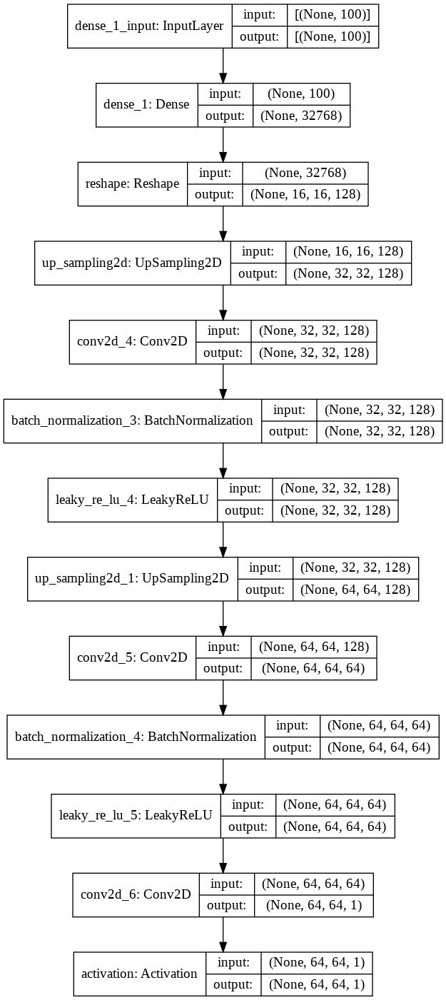

In [31]:
plot_model(generator, show_shapes=True)

In [39]:
# Train using GPU acceleration
# (see https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=Y04m-jvKRDsJ)
device_name = test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
        '\n\nThis error most likely means that this notebook is not '
        'configured to use a GPU.  Change this in Notebook Settings via the '
        'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

# Lower the number of iterations when you start debugging! You want a short testing cycle until you are confident
# that the code is working. Also, since the exercises involve models with less complicated patterns, you will
# likely not need as many iterations to train well.
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.7758334204554558, acc.: 53.12%] [G loss: 0.6620218753814697]
50 [D loss: 0.5556477904319763, acc.: 71.88%] [G loss: 0.8593900203704834]
100 [D loss: 0.186927892267704, acc.: 96.88%] [G loss: 0.6381767988204956]
150 [D loss: 0.16241418570280075, acc.: 96.88%] [G loss: 0.1694624423980713]
200 [D loss: 0.044297682121396065, acc.: 100.00%] [G loss: 0.8576184511184692]
250 [D loss: 0.5685330331325531, acc.: 68.75%] [G loss: 0.2742917537689209]
300 [D loss: 0.047410789877176285, acc.: 100.00%] [G loss: 0.48747727274894714]
350 [D loss: 0.04624090110883117, acc.: 100.00%] [G loss: 0.2513924241065979]
400 [D loss: 0.05868680402636528, acc.: 100.00%] [G loss: 0.22412312030792236]
450 [D loss: 4.429904460906982, acc.: 0.00%] [G loss: 0.5049523711204529]
500 [D loss: 3.851066827774048, acc.: 6.25%] [G loss: 0.48511990904808044]


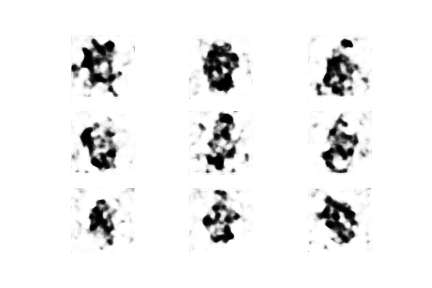

In [44]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

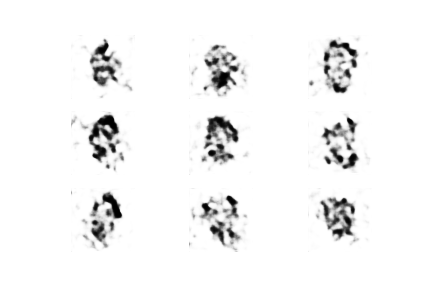

In [ ]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

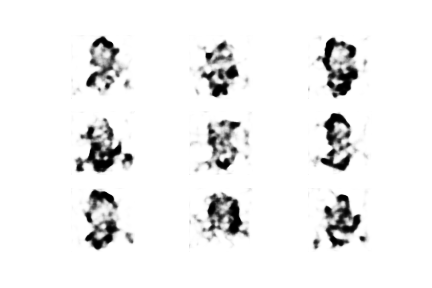

In [ ]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

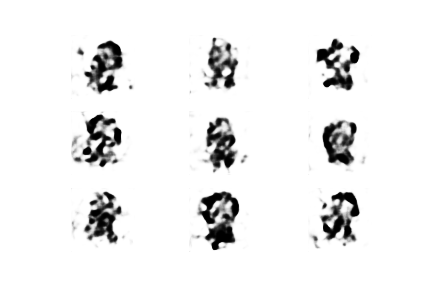

In [42]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

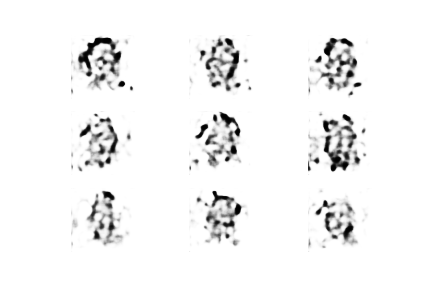

In [ ]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

This round of training started off creating darker blobs which resembled faces, but soon devolved to perlin noise like texture which I can only assume is overfitting.

In [45]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.16754933446645737, acc.: 96.88%] [G loss: 0.06314349174499512]
50 [D loss: 0.16923151165246964, acc.: 93.75%] [G loss: 0.25925034284591675]
100 [D loss: 0.029662172310054302, acc.: 100.00%] [G loss: 0.23575282096862793]
150 [D loss: 0.02131317788735032, acc.: 100.00%] [G loss: 0.22356051206588745]
200 [D loss: 0.14975032210350037, acc.: 100.00%] [G loss: 0.5364357233047485]
250 [D loss: 0.12811598181724548, acc.: 100.00%] [G loss: 0.4247986078262329]
300 [D loss: 0.07253827154636383, acc.: 100.00%] [G loss: 0.22823786735534668]
350 [D loss: 0.03914852812886238, acc.: 100.00%] [G loss: 0.27555346488952637]
400 [D loss: 0.0795670710504055, acc.: 100.00%] [G loss: 0.2437785565853119]
450 [D loss: 0.04575790464878082, acc.: 100.00%] [G loss: 0.5924121141433716]
500 [D loss: 0.09840578585863113, acc.: 100.00%] [G loss: 0.28452104330062866]


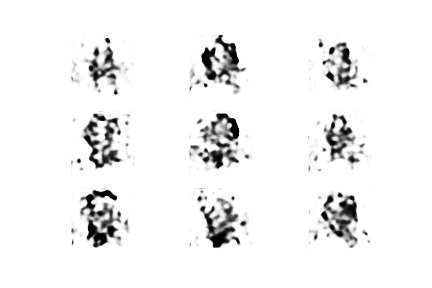

In [46]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

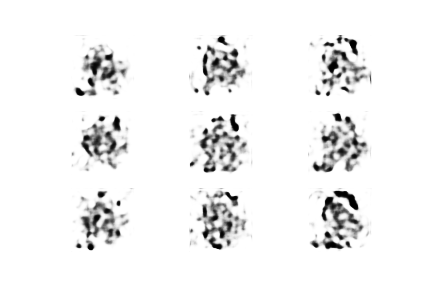

In [47]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

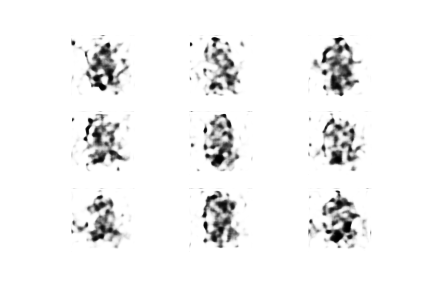

In [48]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

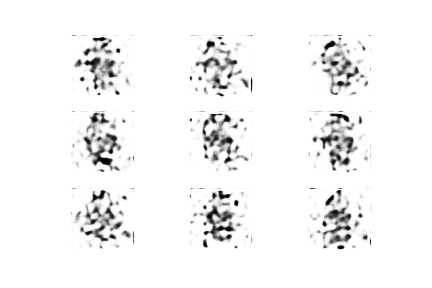

In [49]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

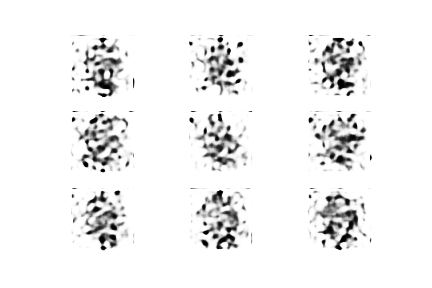

In [50]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In the second round we see even more of that, as the face shapes become less and less recognizable.

In [53]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.06743809953331947, acc.: 100.00%] [G loss: 0.30051305890083313]
50 [D loss: 0.07434321939945221, acc.: 100.00%] [G loss: 0.4061407446861267]
100 [D loss: 0.06490063294768333, acc.: 100.00%] [G loss: 0.31665679812431335]
150 [D loss: 0.1773163080215454, acc.: 100.00%] [G loss: 0.17354613542556763]
200 [D loss: 0.11646848917007446, acc.: 100.00%] [G loss: 0.3655337691307068]
250 [D loss: 0.029634268954396248, acc.: 100.00%] [G loss: 0.12902706861495972]
300 [D loss: 0.11403844505548477, acc.: 100.00%] [G loss: 0.1786462515592575]
350 [D loss: 0.10886640101671219, acc.: 100.00%] [G loss: 0.039877086877822876]
400 [D loss: 0.02550314925611019, acc.: 100.00%] [G loss: 0.21746587753295898]
450 [D loss: 0.04509958066046238, acc.: 100.00%] [G loss: 0.16656115651130676]
500 [D loss: 0.3013656735420227, acc.: 90.62%] [G loss: 0.31141120195388794]


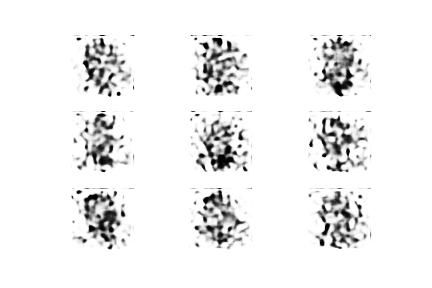

In [54]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

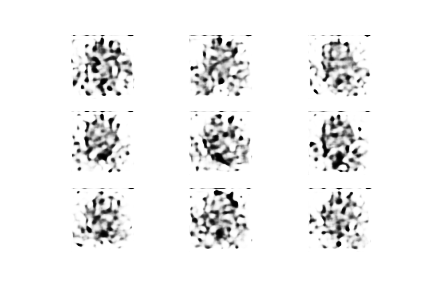

In [55]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

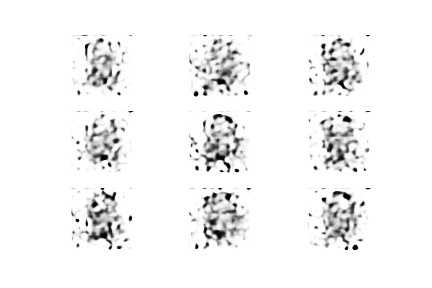

In [56]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

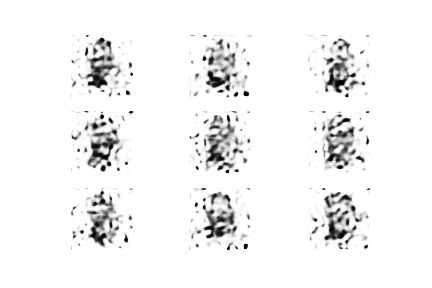

In [57]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

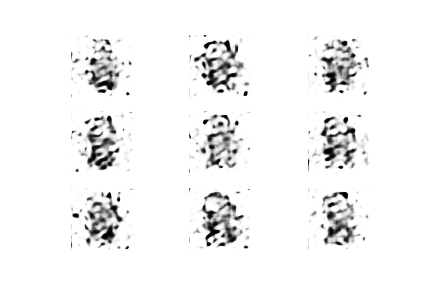

In [58]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

This third round had somewhat face-like shapes, but was still nowhere close to a mugshot.

In [59]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.1972198821604252, acc.: 100.00%] [G loss: 0.48374947905540466]
50 [D loss: 0.17115522921085358, acc.: 100.00%] [G loss: 0.15158607065677643]
100 [D loss: 0.12382028996944427, acc.: 100.00%] [G loss: 0.2818163335323334]
150 [D loss: 0.03590246383100748, acc.: 100.00%] [G loss: 0.3708924353122711]
200 [D loss: 1.0675571262836456, acc.: 40.62%] [G loss: 0.27572405338287354]
250 [D loss: 0.24824593216180801, acc.: 96.88%] [G loss: 0.3658025860786438]
300 [D loss: 0.07599839009344578, acc.: 100.00%] [G loss: 0.15182286500930786]
350 [D loss: 0.08693008124828339, acc.: 100.00%] [G loss: 0.18797831237316132]
400 [D loss: 0.3211878687143326, acc.: 96.88%] [G loss: 0.36594849824905396]
450 [D loss: 0.04862874373793602, acc.: 100.00%] [G loss: 0.25635966658592224]
500 [D loss: 0.16975891590118408, acc.: 100.00%] [G loss: 0.1661960929632187]


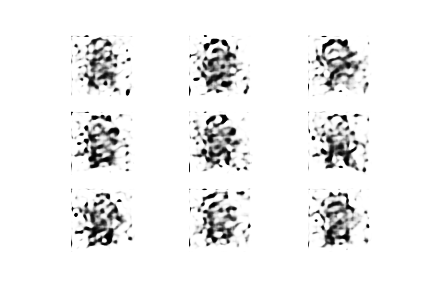

In [60]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

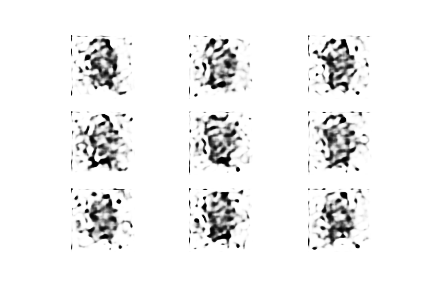

In [67]:
Image(filename=os.path.join(images_dir, 'mnist_150.png'))

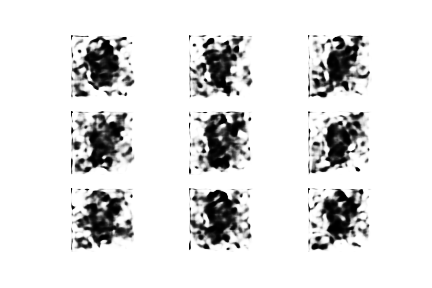

In [61]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

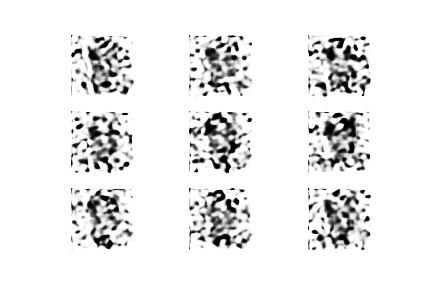

In [66]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

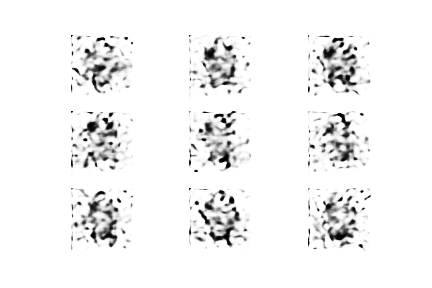

In [64]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

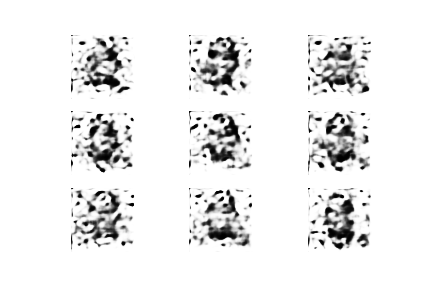

In [63]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

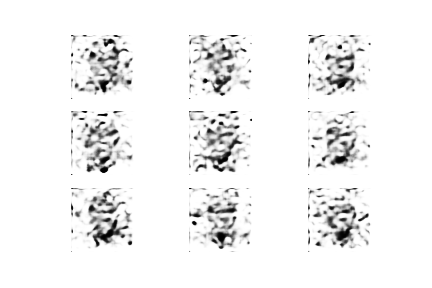

In [65]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

I was happy in the 200th epoch to see something more face like in this fourth rounds. Looking back though, I'm not sure why I continued training the model. It certainly needed a fresh start.

In [68]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.16760774701833725, acc.: 96.88%] [G loss: 0.2128089964389801]
50 [D loss: 0.05864802002906799, acc.: 100.00%] [G loss: 0.26523250341415405]
100 [D loss: 0.051370011642575264, acc.: 100.00%] [G loss: 0.3002234995365143]
150 [D loss: 0.16135452687740326, acc.: 100.00%] [G loss: 0.44025009870529175]
200 [D loss: 0.11701508611440659, acc.: 100.00%] [G loss: 0.057939402759075165]
250 [D loss: 0.058620233088731766, acc.: 100.00%] [G loss: 0.15262064337730408]
300 [D loss: 0.08820218592882156, acc.: 100.00%] [G loss: 0.263254851102829]
350 [D loss: 0.04465866647660732, acc.: 100.00%] [G loss: 0.23509784042835236]
400 [D loss: 0.2774706892669201, acc.: 100.00%] [G loss: 0.15129181742668152]
450 [D loss: 0.5387421399354935, acc.: 71.88%] [G loss: 0.062525674700737]
500 [D loss: 2.21874338388443, acc.: 0.00%] [G loss: 0.021031243726611137]


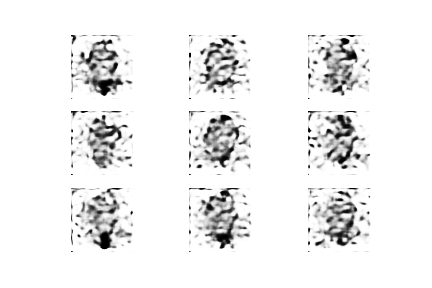

In [72]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

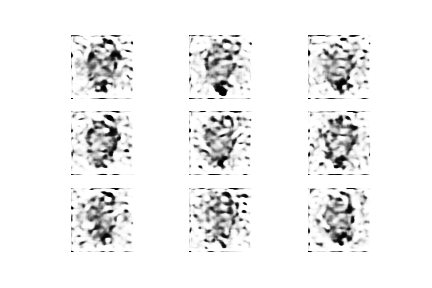

In [73]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

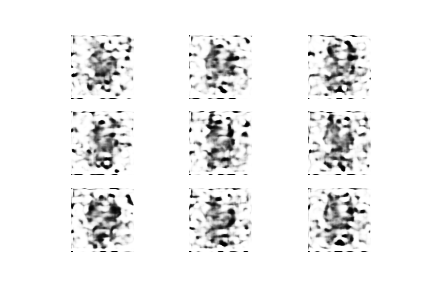

In [74]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

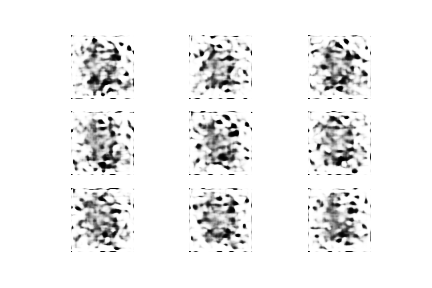

In [76]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

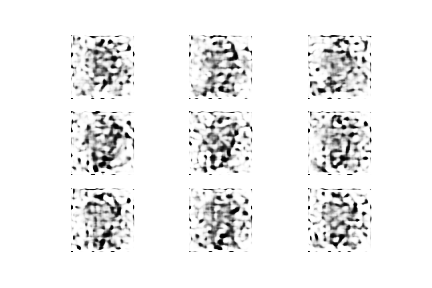

In [77]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

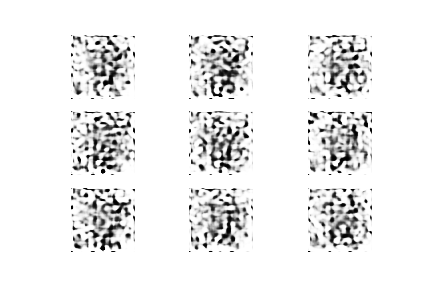

In [78]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

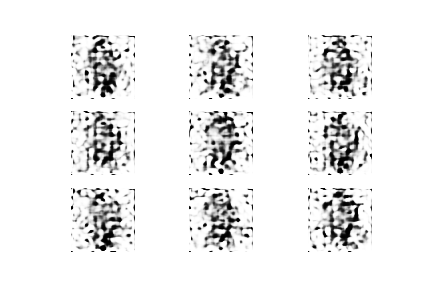

In [79]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In the 5th round, there were somewhat face-resembling epochs, such as epoch 50, but otherwise it was more of the same. This was where I decided to revamp the model. To help out with this I looked to published models, such as the example [MNIST model](https://www.tensorflow.org/tutorials/generative/dcgan) on the Tensorflow site. Another I looked at was the CIFAR model [page](https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/) on a machine learning teaching website, and their [page](https://machinelearningmastery.com/upsampling-and-transpose-convolution-layers-for-generative-adversarial-networks/) on upsampling and convolutional layers.

I reasoned that the issue with the previous GAN was not the discriminator, as that was classifying the images perfectly fine, but rather the generator, which was spitting out crap. When looking through these articles above, I found that surprisingly, for the most part the generators in them were quite similar to this previous one. The key difference I noticed was the use of Conv2DTranspose layers instead of Conv2D layers. Apparently this kind of layer is like the opposite of a convolutional layer (??), and it replaces both the upsampling and convolutional layers. I did not realize this and thought that it was just a better suited type of convolutional layer. Thus, I just replaced the convlutional layers with Conv2DTranspose to not much success.

In [84]:
def build_discriminator():
    '''
    Put together a CNN that will return a single confidence output.
    
    returns: the model object
    '''

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

def build_generator():
    '''
    Put together a model that takes in one-dimensional noise and outputs two-dimensional
    data representing a black and white image, with -1 for black and 1 for white.
    
    returns: the model object
    '''

    noise_shape = (noise_len,)

    model = Sequential()

    model.add(Dense(128 * 16 * 16, activation="relu", input_shape=noise_shape))  # had to be changed
    model.add(Reshape((16, 16, 128)))
    model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2DTranspose(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2DTranspose(64, kernel_size=5, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(1, kernel_size=5, padding="same"))
    model.add(Activation("tanh"))

    return model

def build_combined():
    '''
    Puts together a model that combines the discriminator and generator models.
    
    returns: the generator, discriminator, and combined model objects
    '''
    
    optimizer = Adam(0.0002, 0.5)

    # Build and compile the discriminator
    discriminator = build_discriminator()
    discriminator.compile(loss='binary_crossentropy', 
                          optimizer=optimizer,
                          metrics=['accuracy'])


    # Build and compile the generator
    generator = build_generator()

    # The generator takes noise as input and generates images
    noise = Input(shape=(noise_len,))
    img = generator(noise)
    
    # For the combined model we will only train the generator
    discriminator.trainable = False

    # The discriminator takes generated images as input and determines validity
    valid = discriminator(img)

    # The combined model  (stacked generator and discriminator) takes
    # noise as input => generates images => determines validity 
    combined = Model(inputs=noise, outputs=valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator, discriminator, combined

def save_imgs(generator, iteration):
    '''
    Has the generator create images and saves the images in a single file that includes
    the number of iterations in the filename.
    
    inputs:
        generator: the generator model object returned by build_combined
        iteration: the iteration number (but can be anything that can be represented as a string)
    
    returns: None
    '''
    r, c = 3, 3
    noise = np.random.normal(0, 1, (r * c, noise_len))
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray', vmin=-1, vmax=1)
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(images_dir, 'mnist_{}.png'.format(iteration)))
    plt.close()

def train(generator, discriminator, combined, dataset, iterations, batch_size=128, save_interval=50):
    '''
    Trains all model objects
    
    generator: the generator model object returned by build_combined
    discriminator: the discriminator model object returned by build_combined
    combined: the combined model object returned by build_combined
    iterations: integer, the number of iterations to train for
    batch_size: integer, the number of training samples to use at a time
    save_interval: integer, will generate and save images when the current iteration_num % save_interval is 0
    
    returns: None
    '''

    # Load the dataset
    #(X_train, _), (_, _) = mnist.load_data()
    # load mugshots here
    X_train = dataset


    # Rescale -1 to 1
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    half_batch = int(batch_size / 2)

    for iteration in range(iterations):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random half batch of images
        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

        # Sample noise and generate a half batch of new images
        noise = np.random.normal(0, 1, (half_batch, noise_len))
        gen_imgs = generator.predict(noise)

        # Train the discriminator (real images classified as ones and generated images as zeros)
        real = 1
        fake = 0
        # Use noisy labels: about 10% of the time, swap the labels
        # (see https://github.com/soumith/ganhacks)
        if np.random.randint(0, 10) < 1:
            real = 0
            fake = 1
        d_loss_real = discriminator.train_on_batch(imgs, np.zeros((half_batch, 1)) + real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)) + fake)

        # ---------------------
        #  Train Generator
        # ---------------------

        noise = np.random.normal(0, 1, (batch_size, noise_len))

        # Train the generator (wants discriminator to mistake images as real)
        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

        # If at save interval => save generated image samples and plot progress
        if iteration % save_interval == 0:
            # Plot the progress
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            print ("{} [D loss: {}, acc.: {:.2%}] [G loss: {}]".format(iteration, d_loss[0], d_loss[1], g_loss))
            save_imgs(generator, iteration)
            
def show_new_image(generator):
    '''
    Generates and displays a new image
    
    inputs: generator object model returned from build_combined
    
    returns: generated image
    '''
    
    noise = np.random.normal(0, 1, (1, noise_len))
    gen_img = generator.predict(noise)[0][:,:,0]
    
    return plt.imshow(gen_img, cmap='gray', vmin=-1, vmax=1)

In [85]:
generator, discriminator, combined = build_combined()

In [105]:
generator.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 32768)             3309568   
_________________________________________________________________
reshape_5 (Reshape)          (None, 16, 16, 128)       0         
_________________________________________________________________
up_sampling2d_10 (UpSampling (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (None, 32, 32, 128)       147584    
_________________________________________________________________
batch_normalization_28 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 32, 32, 128)       0         
_________________________________________________________________
up_sampling2d_11 (UpSampling (None, 64, 64, 128)     

In [106]:
discriminator.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_29 (Conv2D)           (None, 32, 32, 32)        320       
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 16, 16, 64)        18496     
_________________________________________________________________
zero_padding2d_5 (ZeroPaddin (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_25 (Batc (None, 17, 17, 64)        256       
_________________________________________________________________
leaky_re_lu_31 (LeakyReLU)   (None, 17, 17, 64)      

In [107]:
combined.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential_11 (Sequential)   (None, 64, 64, 1)         3664385   
_________________________________________________________________
sequential_10 (Sequential)   (None, 1)                 410369    
Total params: 4,074,754
Trainable params: 3,664,001
Non-trainable params: 410,753
_________________________________________________________________


Additionally, for the first time, I looked at the number of parameters of the new model, and... yeah, that's a lot.

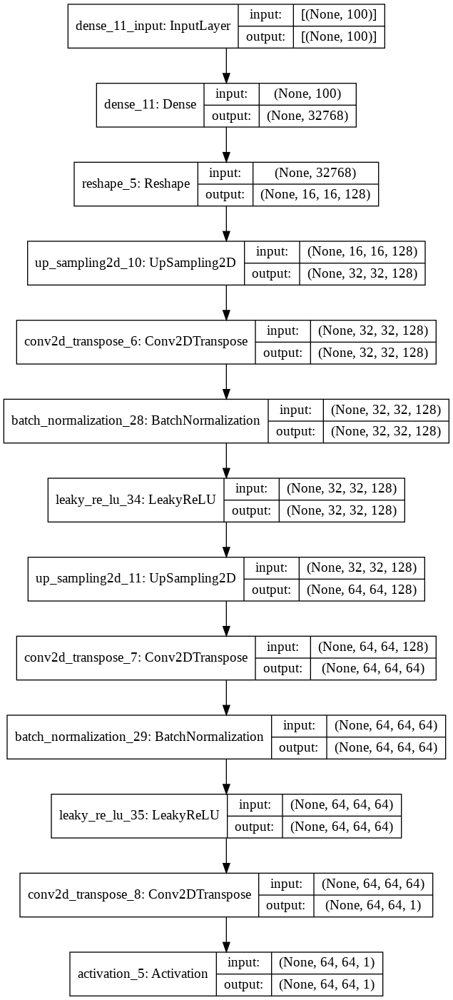

In [86]:
plot_model(generator, show_shapes=True)

In [87]:
# Train using GPU acceleration
# (see https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=Y04m-jvKRDsJ)
device_name = test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
        '\n\nThis error most likely means that this notebook is not '
        'configured to use a GPU.  Change this in Notebook Settings via the '
        'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

# Lower the number of iterations when you start debugging! You want a short testing cycle until you are confident
# that the code is working. Also, since the exercises involve models with less complicated patterns, you will
# likely not need as many iterations to train well.
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 1.1635147333145142, acc.: 40.62%] [G loss: 0.7213658094406128]
50 [D loss: 0.5568194836378098, acc.: 71.88%] [G loss: 0.9939291477203369]
100 [D loss: 0.6187441647052765, acc.: 68.75%] [G loss: 1.1104745864868164]
150 [D loss: 0.2999807819724083, acc.: 87.50%] [G loss: 0.6521148681640625]
200 [D loss: 0.1680017113685608, acc.: 93.75%] [G loss: 0.7116589546203613]
250 [D loss: 0.2891984209418297, acc.: 96.88%] [G loss: 0.7513489127159119]
300 [D loss: 3.1593971252441406, acc.: 0.00%] [G loss: 0.22786441445350647]
350 [D loss: 0.11538679897785187, acc.: 100.00%] [G loss: 0.4301075339317322]
400 [D loss: 0.07195981591939926, acc.: 100.00%] [G loss: 0.07048799097537994]
450 [D loss: 6.276031970977783, acc.: 0.00%] [G loss: 0.45594531297683716]
500 [D loss: 0.18072505667805672, acc.: 96.88%] [G loss: 0.375154584646225]


Seeing the low accuracies, at first I had high hopes, but as you will see, those were dashed quickly.

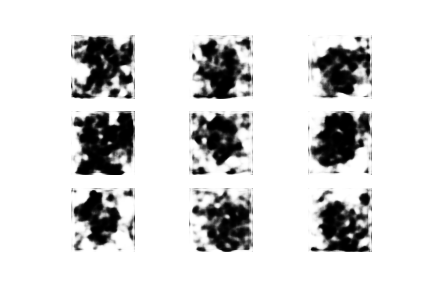

In [94]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

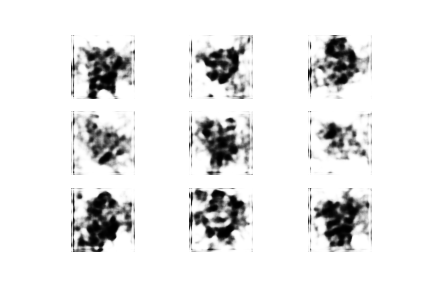

In [ ]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

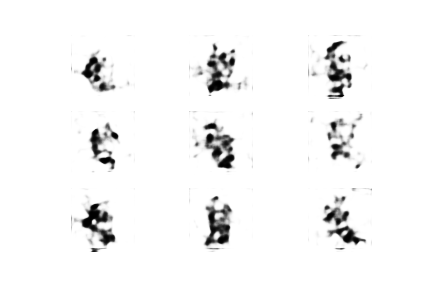

In [93]:
Image(filename=os.path.join(images_dir, 'mnist_150.png'))

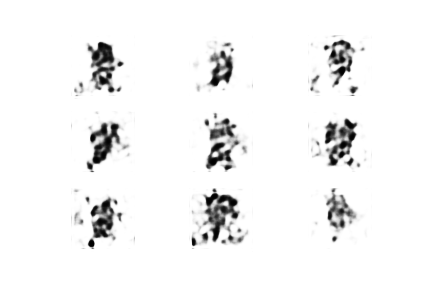

In [89]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

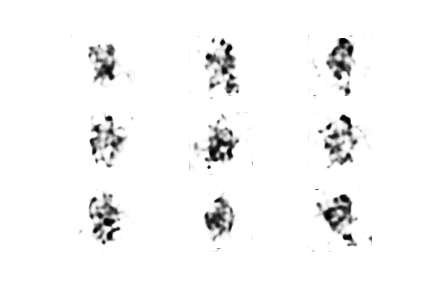

In [90]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

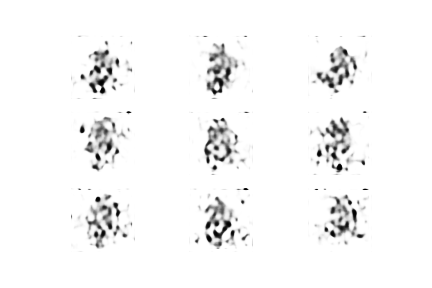

In [91]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

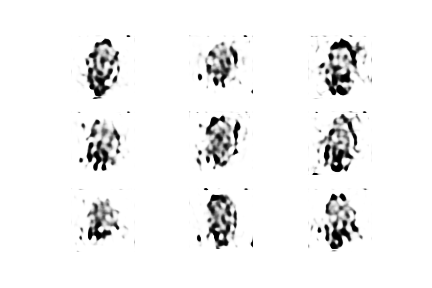

In [95]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

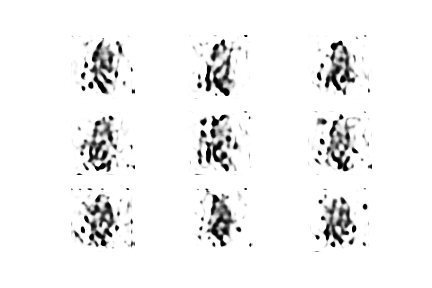

In [92]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

You could argue that maybe up to epoch 200 the images have a semblence of a face, but after that there's really nothing.

In [96]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.192185677587986, acc.: 96.88%] [G loss: 0.4728469252586365]
50 [D loss: 1.0321942865848541, acc.: 40.62%] [G loss: 0.215828076004982]
100 [D loss: 0.03011031076312065, acc.: 100.00%] [G loss: 0.3811396360397339]
150 [D loss: 0.05405295640230179, acc.: 100.00%] [G loss: 0.760242223739624]
200 [D loss: 0.4725598096847534, acc.: 71.88%] [G loss: 0.07041624188423157]
250 [D loss: 0.261397123336792, acc.: 93.75%] [G loss: 0.5321437120437622]
300 [D loss: 0.05059052258729935, acc.: 100.00%] [G loss: 0.3236231803894043]
350 [D loss: 0.12361958250403404, acc.: 100.00%] [G loss: 0.3364779055118561]
400 [D loss: 0.09290112555027008, acc.: 100.00%] [G loss: 0.2007274627685547]
450 [D loss: 0.4146471470594406, acc.: 84.38%] [G loss: 0.07857286930084229]
500 [D loss: 0.23173785954713821, acc.: 96.88%] [G loss: 0.4062560200691223]


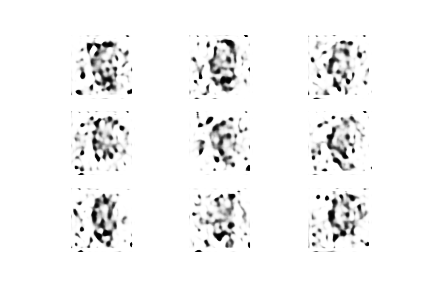

In [97]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

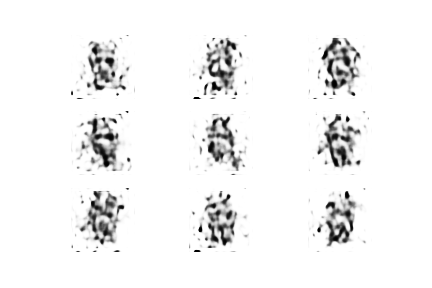

In [98]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

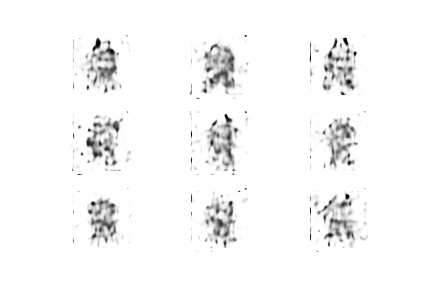

In [99]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

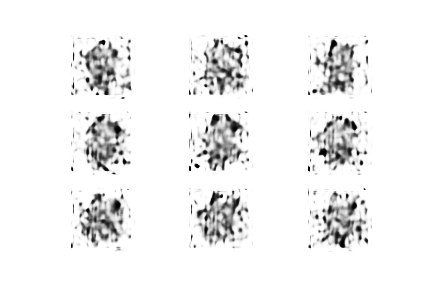

In [100]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

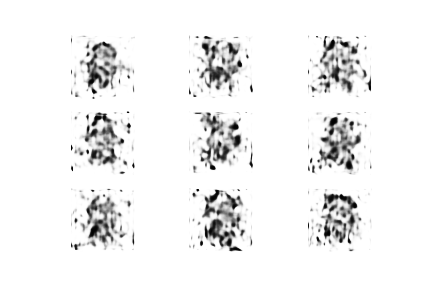

In [101]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

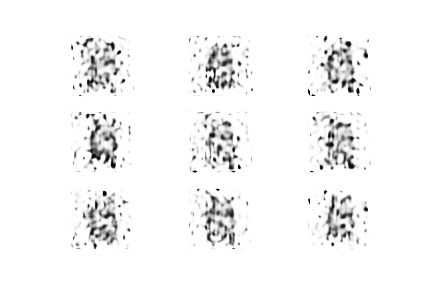

In [102]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

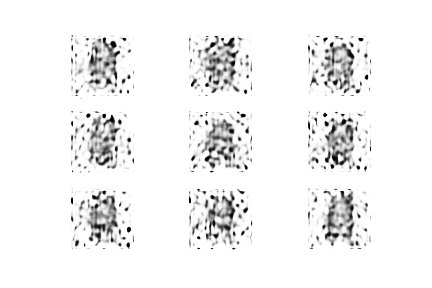

In [103]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

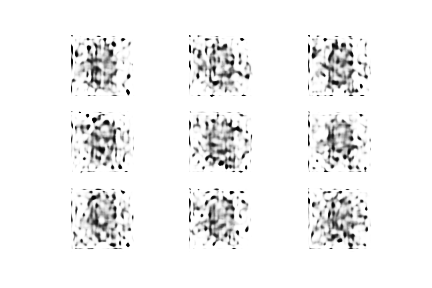

In [104]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

Nothing noteworthy in this round. At this point I decided to start using Conv2DTranspose layers correctly and I increased the number of filters, to bring the model more in line with what the articles had. Let's see how that went.

In [1]:
def build_discriminator():
    '''
    Put together a CNN that will return a single confidence output.
    
    returns: the model object
    '''

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

def build_generator():
    '''
    Put together a model that takes in one-dimensional noise and outputs two-dimensional
    data representing a black and white image, with -1 for black and 1 for white.
    
    returns: the model object
    '''

    noise_shape = (noise_len,)

    model = Sequential()

    model.add(Dense(256 * 16 * 16, activation="relu", input_shape=noise_shape))  # had to be changed
    model.add(Reshape((16, 16, 256)))
    #model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2DTranspose(128, kernel_size=5, strides=(1,1), padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    #model.add(UpSampling2D(interpolation="bilinear"))
    model.add(Conv2DTranspose(64, kernel_size=5, strides=(2,2), padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(1, kernel_size=5, strides=(2,2), padding="same"))
    model.add(Activation("tanh"))

    return model

def build_combined():
    '''
    Puts together a model that combines the discriminator and generator models.
    
    returns: the generator, discriminator, and combined model objects
    '''
    
    optimizer = Adam(0.0002, 0.5)

    # Build and compile the discriminator
    discriminator = build_discriminator()
    discriminator.compile(loss='binary_crossentropy', 
                          optimizer=optimizer,
                          metrics=['accuracy'])


    # Build and compile the generator
    generator = build_generator()

    # The generator takes noise as input and generates images
    noise = Input(shape=(noise_len,))
    img = generator(noise)
    
    # For the combined model we will only train the generator
    discriminator.trainable = False

    # The discriminator takes generated images as input and determines validity
    valid = discriminator(img)

    # The combined model  (stacked generator and discriminator) takes
    # noise as input => generates images => determines validity 
    combined = Model(inputs=noise, outputs=valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator, discriminator, combined

def save_imgs(generator, iteration):
    '''
    Has the generator create images and saves the images in a single file that includes
    the number of iterations in the filename.
    
    inputs:
        generator: the generator model object returned by build_combined
        iteration: the iteration number (but can be anything that can be represented as a string)
    
    returns: None
    '''
    r, c = 3, 3
    noise = np.random.normal(0, 1, (r * c, noise_len))
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray', vmin=-1, vmax=1)
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(images_dir, 'mnist_{}.png'.format(iteration)))
    plt.close()

def train(generator, discriminator, combined, dataset, iterations, batch_size=128, save_interval=50):
    '''
    Trains all model objects
    
    generator: the generator model object returned by build_combined
    discriminator: the discriminator model object returned by build_combined
    combined: the combined model object returned by build_combined
    iterations: integer, the number of iterations to train for
    batch_size: integer, the number of training samples to use at a time
    save_interval: integer, will generate and save images when the current iteration_num % save_interval is 0
    
    returns: None
    '''

    # Load the dataset
    #(X_train, _), (_, _) = mnist.load_data()
    # load mugshots here
    X_train = dataset


    # Rescale -1 to 1
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    half_batch = int(batch_size / 2)

    for iteration in range(iterations):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random half batch of images
        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

        # Sample noise and generate a half batch of new images
        noise = np.random.normal(0, 1, (half_batch, noise_len))
        gen_imgs = generator.predict(noise)

        # Train the discriminator (real images classified as ones and generated images as zeros)
        real = 1
        fake = 0
        # Use noisy labels: about 10% of the time, swap the labels
        # (see https://github.com/soumith/ganhacks)
        if np.random.randint(0, 10) < 1:
            real = 0
            fake = 1
        d_loss_real = discriminator.train_on_batch(imgs, np.zeros((half_batch, 1)) + real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)) + fake)

        # ---------------------
        #  Train Generator
        # ---------------------

        noise = np.random.normal(0, 1, (batch_size, noise_len))

        # Train the generator (wants discriminator to mistake images as real)
        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

        # If at save interval => save generated image samples and plot progress
        if iteration % save_interval == 0:
            # Plot the progress
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            print ("{} [D loss: {}, acc.: {:.2%}] [G loss: {}]".format(iteration, d_loss[0], d_loss[1], g_loss))
            save_imgs(generator, iteration)
            
def show_new_image(generator):
    '''
    Generates and displays a new image
    
    inputs: generator object model returned from build_combined
    
    returns: generated image
    '''
    
    noise = np.random.normal(0, 1, (1, noise_len))
    gen_img = generator.predict(noise)[0][:,:,0]
    
    return plt.imshow(gen_img, cmap='gray', vmin=-1, vmax=1)

In [8]:
generator, discriminator, combined = build_combined()

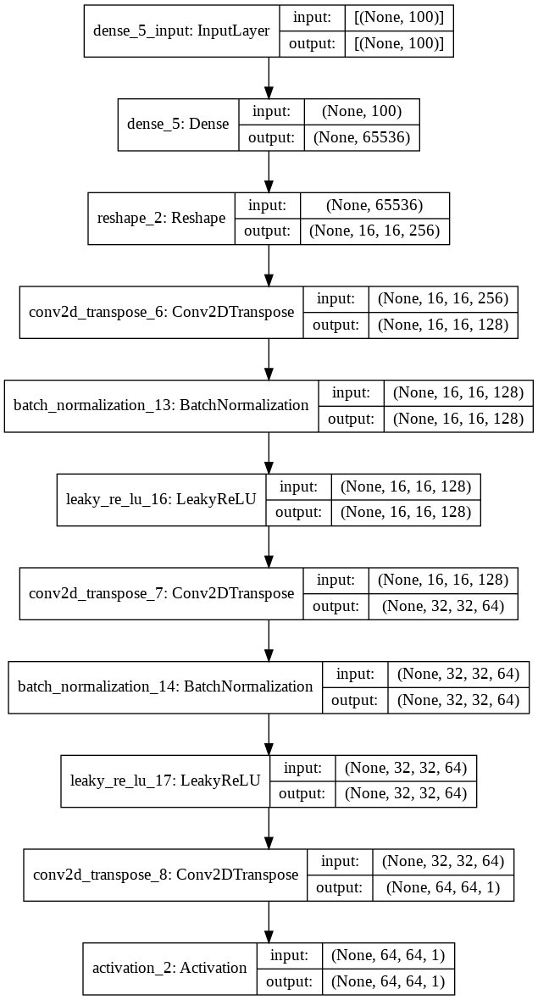

In [9]:
plot_model(generator, show_shapes=True)

In [18]:
generator.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 65536)             6619136   
_________________________________________________________________
reshape_2 (Reshape)          (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_6 (Conv2DTr (None, 16, 16, 128)       819328    
_________________________________________________________________
batch_normalization_13 (Batc (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_transpose_7 (Conv2DTr (None, 32, 32, 64)        204864    
_________________________________________________________________
batch_normalization_14 (Batc (None, 32, 32, 64)       

In [19]:
discriminator.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 32, 32, 32)        320       
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 17, 17, 64)        256       
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 17, 17, 64)       

In [20]:
combined.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential_5 (Sequential)    (None, 64, 64, 1)         7645697   
_________________________________________________________________
sequential_4 (Sequential)    (None, 1)                 410369    
Total params: 8,056,066
Trainable params: 7,645,313
Non-trainable params: 410,753
_________________________________________________________________


In [10]:
# Train using GPU acceleration
# (see https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=Y04m-jvKRDsJ)
device_name = test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
        '\n\nThis error most likely means that this notebook is not '
        'configured to use a GPU.  Change this in Notebook Settings via the '
        'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

# Lower the number of iterations when you start debugging! You want a short testing cycle until you are confident
# that the code is working. Also, since the exercises involve models with less complicated patterns, you will
# likely not need as many iterations to train well.
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 1.2241687774658203, acc.: 37.50%] [G loss: 0.6859403848648071]
50 [D loss: 0.5384545028209686, acc.: 81.25%] [G loss: 0.9423346519470215]
100 [D loss: 0.36970284581184387, acc.: 84.38%] [G loss: 1.2150852680206299]
150 [D loss: 0.06022495590150356, acc.: 100.00%] [G loss: 0.7522247433662415]
200 [D loss: 0.014365719631314278, acc.: 100.00%] [G loss: 0.68488609790802]
250 [D loss: 0.005467324052006006, acc.: 100.00%] [G loss: 0.7607287168502808]
300 [D loss: 2.144931897521019, acc.: 46.88%] [G loss: 0.08400480449199677]
350 [D loss: 1.7510913610458374, acc.: 43.75%] [G loss: 0.03297683969140053]
400 [D loss: 0.0411047488451004, acc.: 100.00%] [G loss: 0.5410034656524658]
450 [D loss: 0.123235322535038, acc.: 100.00%] [G loss: 0.5996323823928833]
500 [D loss: 0.019132870249450207, acc.: 100.00%] [G loss: 0.7646845579147339]


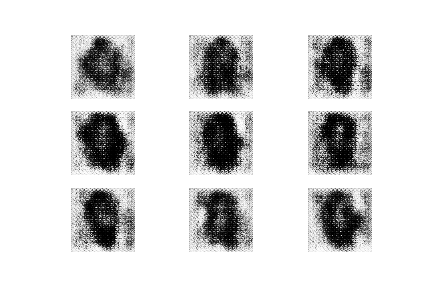

In [12]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

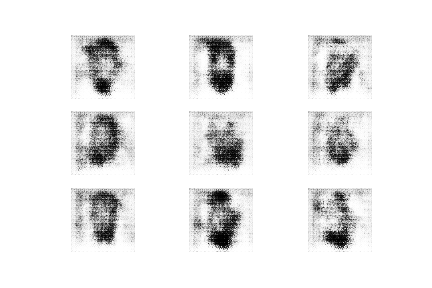

In [11]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

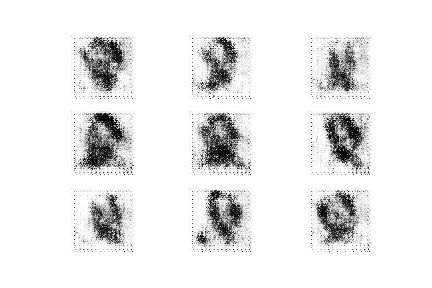

In [13]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

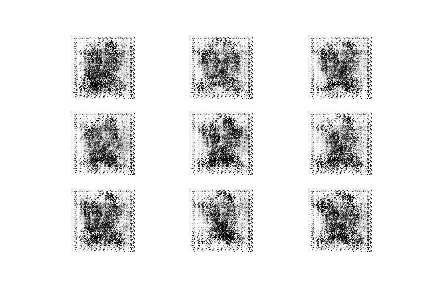

In [15]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

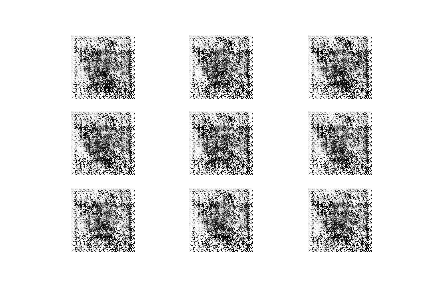

In [14]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

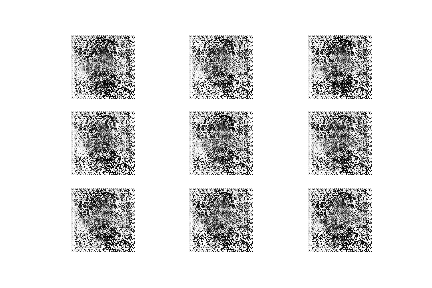

In [21]:
Image(filename=os.path.join(images_dir, 'mnist_350.png'))

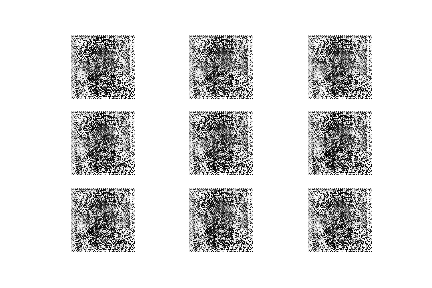

In [16]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

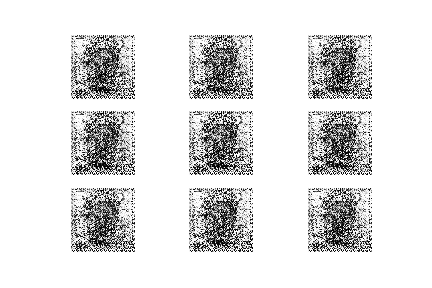

In [17]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

It actually started off pretty well, and you can really see the facial shapes in epoch 200, but after that it devolves into static. Notably, Conv2DTranspose (deconvolutional) layers leave specific marks on the images, as [this article](https://distill.pub/2016/deconv-checkerboard/) notes. It's well known that the deconvolutional layer leaves a repeating checkerboard-like pattern in the pixels when examined up close, which is visible in the images above as well.

In [22]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 5.127933025360107, acc.: 0.00%] [G loss: 0.03272509202361107]
50 [D loss: 0.01424291729927063, acc.: 100.00%] [G loss: 0.73663330078125]
100 [D loss: 0.16765988618135452, acc.: 93.75%] [G loss: 0.4689158499240875]
150 [D loss: 0.02211146242916584, acc.: 100.00%] [G loss: 0.7427377700805664]
200 [D loss: 0.028082678094506264, acc.: 100.00%] [G loss: 0.710827112197876]
250 [D loss: 0.04012902081012726, acc.: 100.00%] [G loss: 0.6429647207260132]
300 [D loss: 1.2975621223449707, acc.: 37.50%] [G loss: 0.07353255897760391]
350 [D loss: 0.10735282301902771, acc.: 100.00%] [G loss: 0.523891806602478]
400 [D loss: 0.02082883007824421, acc.: 100.00%] [G loss: 1.0535752773284912]
450 [D loss: 2.1950913667678833, acc.: 6.25%] [G loss: 0.028918327763676643]
500 [D loss: 0.02090391516685486, acc.: 100.00%] [G loss: 0.8769047260284424]


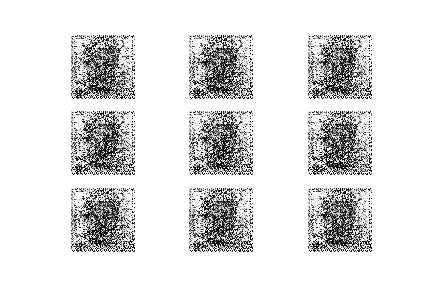

In [23]:
Image(filename=os.path.join(images_dir, 'mnist_0.png'))

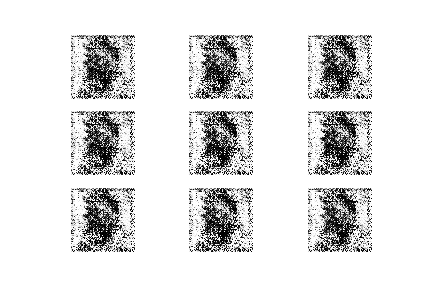

In [24]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

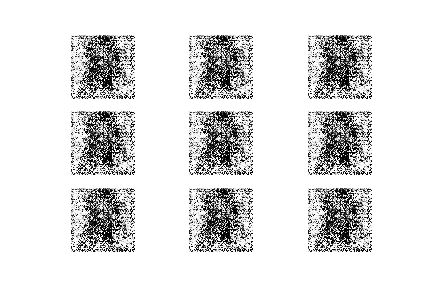

In [25]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

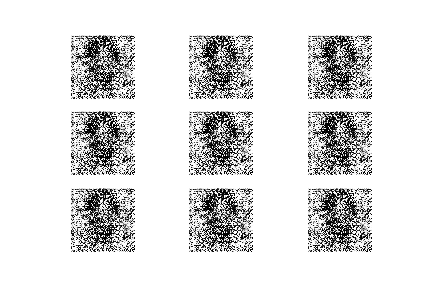

In [26]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

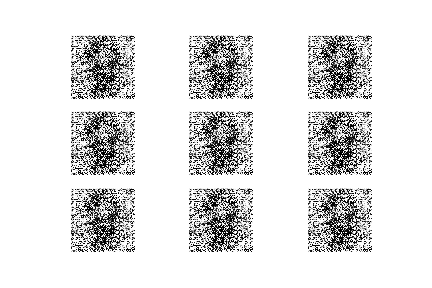

In [27]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

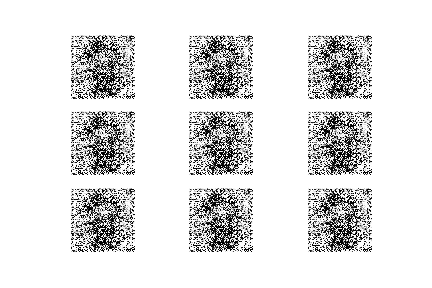

In [28]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

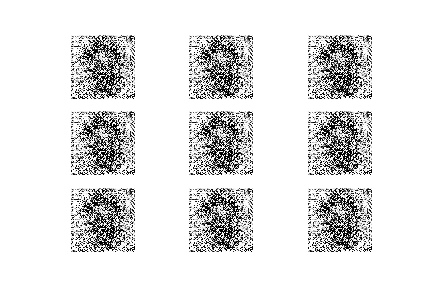

In [29]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In [30]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.025072204880416393, acc.: 100.00%] [G loss: 0.8517590761184692]
50 [D loss: 0.042406970635056496, acc.: 100.00%] [G loss: 0.7675063610076904]
100 [D loss: 2.3500572443008423, acc.: 34.38%] [G loss: 0.008331936784088612]
150 [D loss: 0.09198124520480633, acc.: 100.00%] [G loss: 0.6780256628990173]
200 [D loss: 0.16386433690786362, acc.: 100.00%] [G loss: 0.38590294122695923]
250 [D loss: 0.09621094539761543, acc.: 100.00%] [G loss: 0.7115453481674194]
300 [D loss: 0.1051650308072567, acc.: 100.00%] [G loss: 0.45619747042655945]
350 [D loss: 0.24734416604042053, acc.: 100.00%] [G loss: 0.12470657378435135]
400 [D loss: 1.1895490288734436, acc.: 37.50%] [G loss: 0.06195225194096565]
450 [D loss: 0.027459273114800453, acc.: 100.00%] [G loss: 0.8945531845092773]
500 [D loss: 0.06432810239493847, acc.: 100.00%] [G loss: 0.5337041616439819]


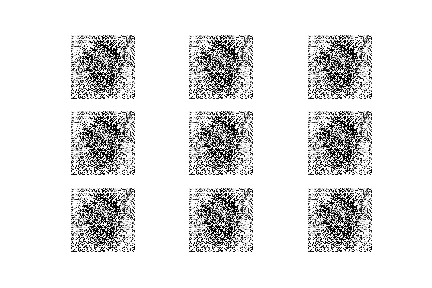

In [31]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

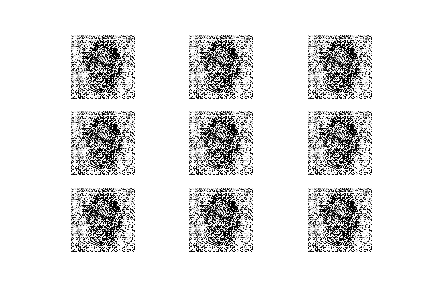

In [32]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

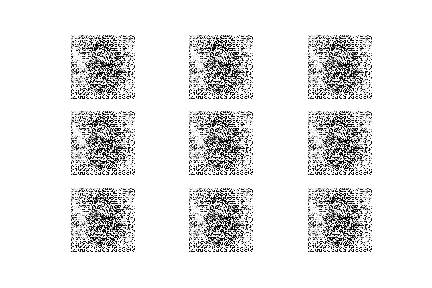

In [33]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

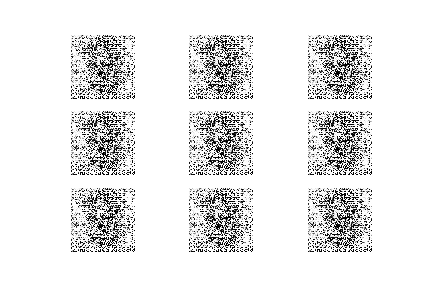

In [34]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

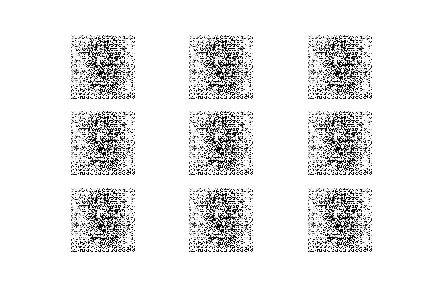

In [35]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

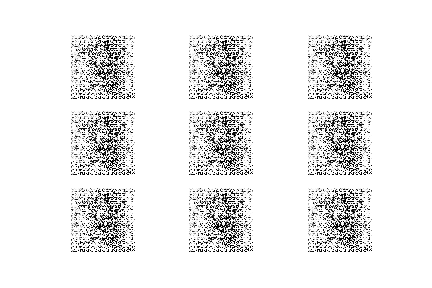

In [36]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In [37]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.06202322989702225, acc.: 100.00%] [G loss: 0.5637911558151245]
50 [D loss: 0.10268441587686539, acc.: 100.00%] [G loss: 0.38408148288726807]
100 [D loss: 0.03832487482577562, acc.: 100.00%] [G loss: 0.6774897575378418]
150 [D loss: 0.605902686715126, acc.: 59.38%] [G loss: 0.09373576939105988]
200 [D loss: 0.06693661957979202, acc.: 100.00%] [G loss: 0.6139013767242432]
250 [D loss: 0.11130670085549355, acc.: 100.00%] [G loss: 0.649645209312439]
300 [D loss: 0.14030968770384789, acc.: 100.00%] [G loss: 0.5728634595870972]
350 [D loss: 0.19261980429291725, acc.: 100.00%] [G loss: 0.13924723863601685]
400 [D loss: 0.08582923002541065, acc.: 100.00%] [G loss: 0.4740215539932251]
450 [D loss: 0.1841694563627243, acc.: 100.00%] [G loss: 0.47597044706344604]
500 [D loss: 0.08770383149385452, acc.: 100.00%] [G loss: 0.48934686183929443]


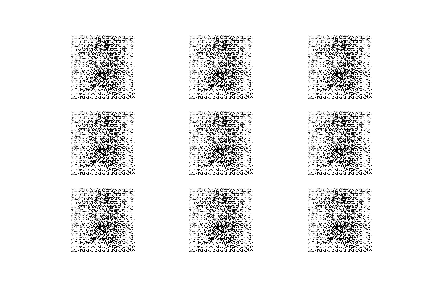

In [38]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

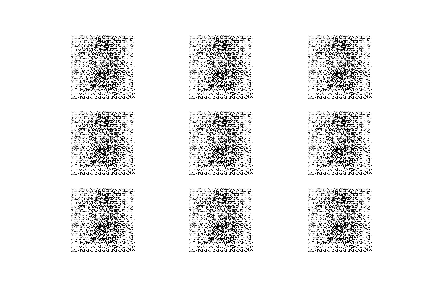

In [41]:
Image(filename=os.path.join(images_dir, 'mnist_150.png'))

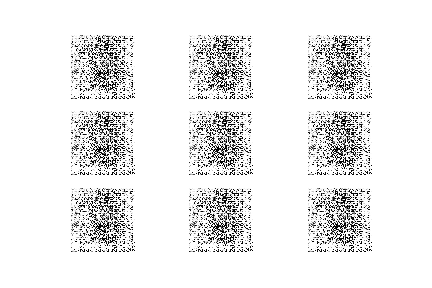

In [39]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

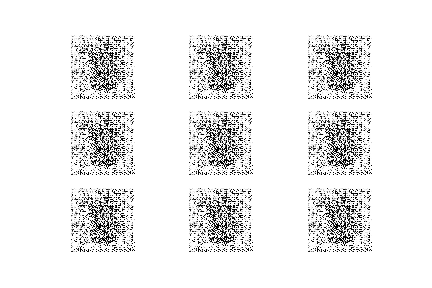

In [40]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

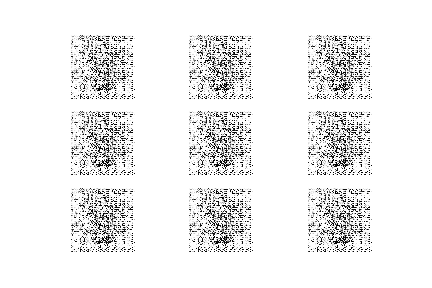

In [42]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

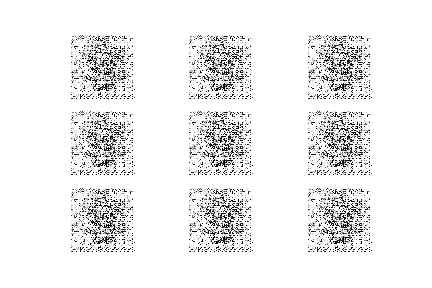

In [43]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In [44]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 3.6096625328063965, acc.: 0.00%] [G loss: 0.34363842010498047]
50 [D loss: 0.07782106101512909, acc.: 100.00%] [G loss: 0.4101404547691345]
100 [D loss: 0.11195427179336548, acc.: 100.00%] [G loss: 0.37068718671798706]
150 [D loss: 3.683930993080139, acc.: 0.00%] [G loss: 0.20962439477443695]
200 [D loss: 3.117243528366089, acc.: 0.00%] [G loss: 0.23470132052898407]
250 [D loss: 0.03516667615622282, acc.: 100.00%] [G loss: 0.22639860212802887]
300 [D loss: 0.07414409145712852, acc.: 100.00%] [G loss: 0.03723522275686264]
350 [D loss: 0.0857554841786623, acc.: 100.00%] [G loss: 0.22682738304138184]
400 [D loss: 0.3017061725258827, acc.: 100.00%] [G loss: 0.10539692640304565]
450 [D loss: 1.3921947479248047, acc.: 50.00%] [G loss: 0.06919316947460175]
500 [D loss: 0.12898989766836166, acc.: 100.00%] [G loss: 0.2111615091562271]


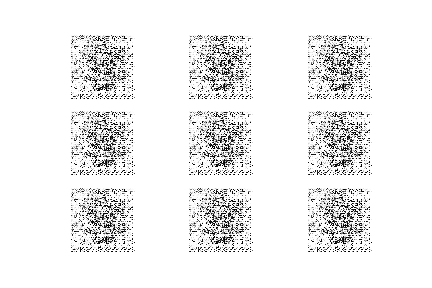

In [45]:
Image(filename=os.path.join(images_dir, 'mnist_0.png'))

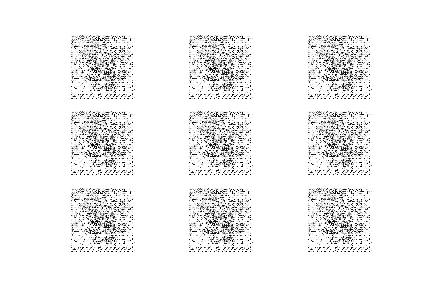

In [46]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

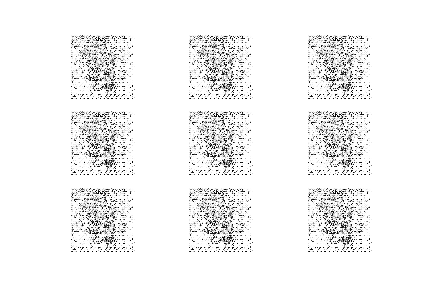

In [47]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

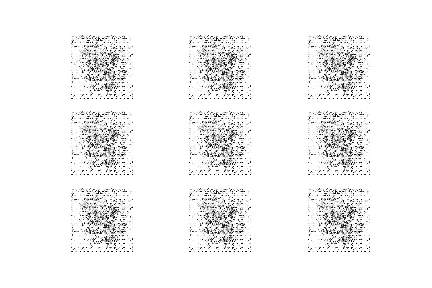

In [48]:
Image(filename=os.path.join(images_dir, 'mnist_150.png'))

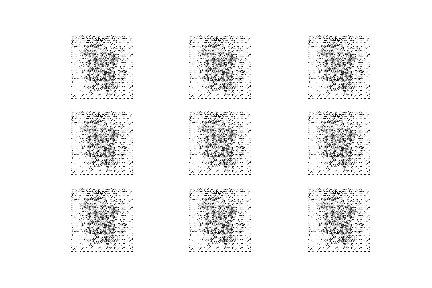

In [49]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

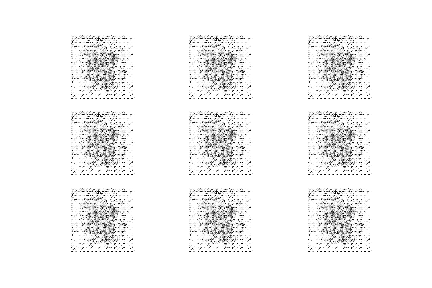

In [50]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

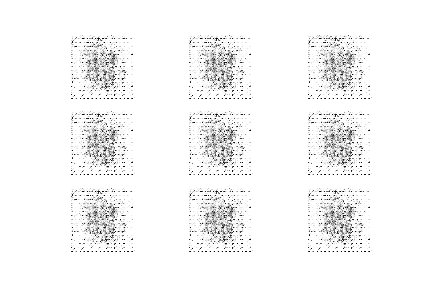

In [51]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

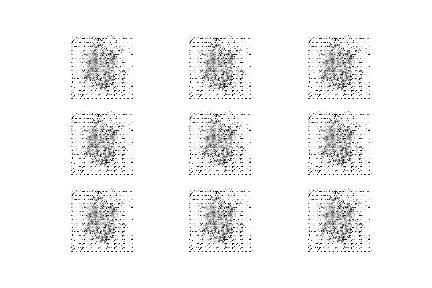

In [52]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

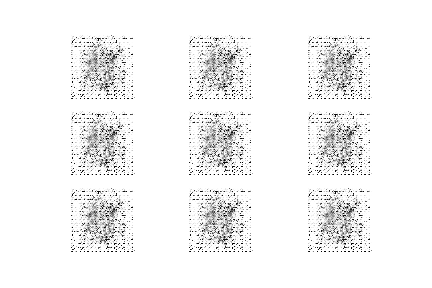

In [53]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

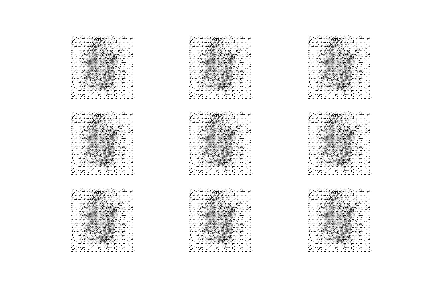

In [54]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

Over these past few rounds, the model has slowly shifted from black and white static to settling on this gray fuzzy blob in the middle of the image which I can only assume is its attempt at a face.

In [55]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.13604387640953064, acc.: 100.00%] [G loss: 0.2659597098827362]
50 [D loss: 0.8171810954809189, acc.: 50.00%] [G loss: 0.08123645186424255]
100 [D loss: 0.12075585126876831, acc.: 100.00%] [G loss: 0.27333909273147583]
150 [D loss: 0.04453972727060318, acc.: 100.00%] [G loss: 0.27935972809791565]
200 [D loss: 2.303499400615692, acc.: 0.00%] [G loss: 0.1427791714668274]
250 [D loss: 0.223812997341156, acc.: 100.00%] [G loss: 0.2978349030017853]
300 [D loss: 3.569433569908142, acc.: 0.00%] [G loss: 0.28472328186035156]
350 [D loss: 0.03919456712901592, acc.: 100.00%] [G loss: 0.30610209703445435]
400 [D loss: 0.21977363154292107, acc.: 96.88%] [G loss: 0.1836538314819336]
450 [D loss: 0.09991728141903877, acc.: 100.00%] [G loss: 0.3672753572463989]
500 [D loss: 0.041141923516988754, acc.: 100.00%] [G loss: 0.31087133288383484]


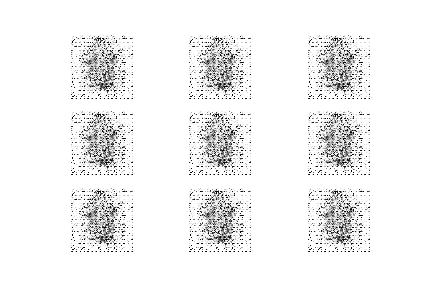

In [56]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

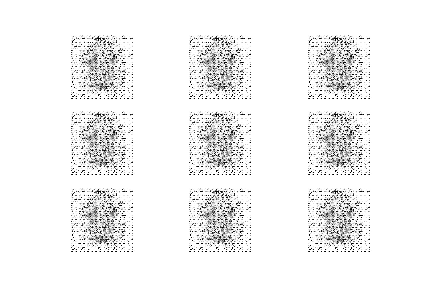

In [57]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

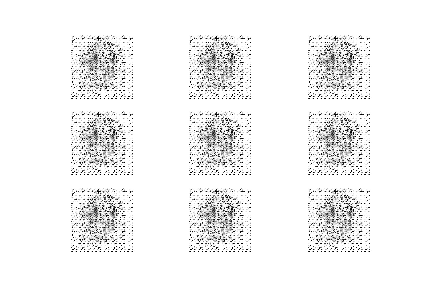

In [58]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

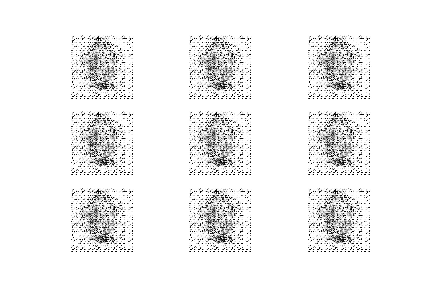

In [60]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

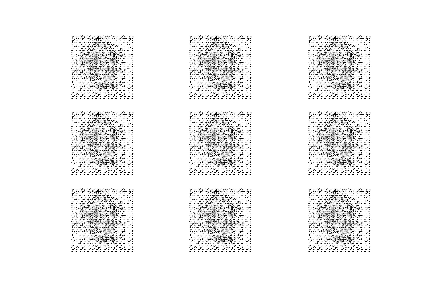

In [59]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

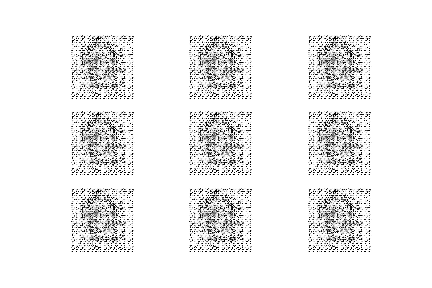

In [61]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

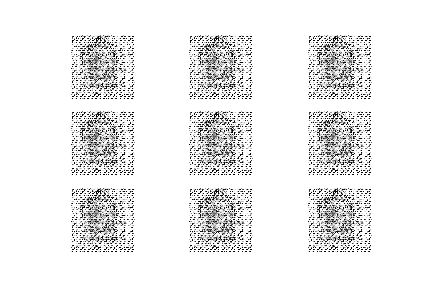

In [62]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

There was improvement in the first few hundred epochs here, as the silhouette of hair and ears (I think?) appeared, but then the model decided to give up and return static.

In [63]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.036866677924990654, acc.: 100.00%] [G loss: 0.2772377133369446]
50 [D loss: 0.12345653772354126, acc.: 100.00%] [G loss: 0.43798011541366577]
100 [D loss: 0.08339563384652138, acc.: 100.00%] [G loss: 0.24368898570537567]
150 [D loss: 0.12436138093471527, acc.: 100.00%] [G loss: 0.35958871245384216]
200 [D loss: 0.17452643066644669, acc.: 100.00%] [G loss: 0.4353290796279907]
250 [D loss: 0.1341857947409153, acc.: 100.00%] [G loss: 0.3878368139266968]
300 [D loss: 0.056213539093732834, acc.: 100.00%] [G loss: 0.28288209438323975]
350 [D loss: 0.09084149450063705, acc.: 100.00%] [G loss: 0.5779322385787964]
400 [D loss: 0.026896418072283268, acc.: 100.00%] [G loss: 0.34953364729881287]
450 [D loss: 0.04435099475085735, acc.: 100.00%] [G loss: 0.3781730532646179]
500 [D loss: 0.05223746597766876, acc.: 100.00%] [G loss: 0.3434625566005707]


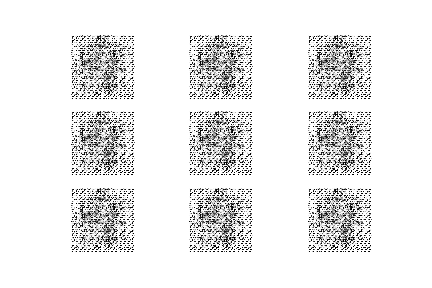

In [64]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

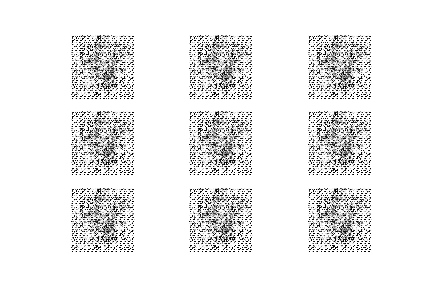

In [65]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

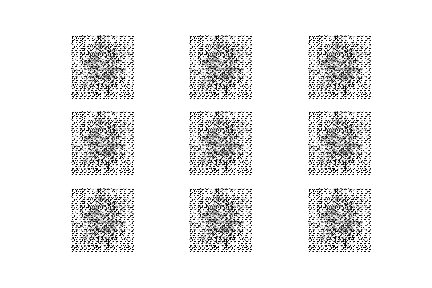

In [66]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

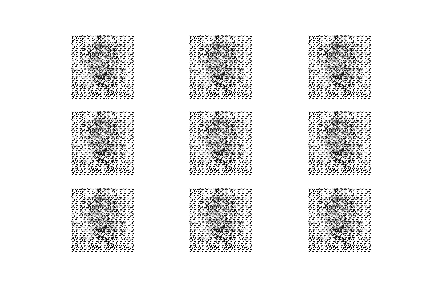

In [67]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

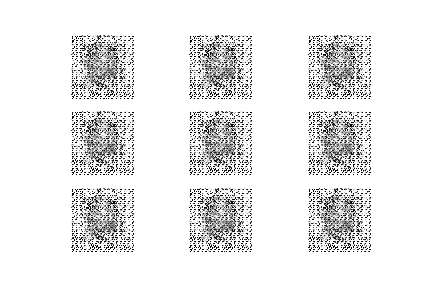

In [68]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

Towards the end of this round we get back the fuzzy gray face shape, but this time with a more staticky background. In total we're at epoch 3500 and I have no idea why I kept running with these initial weights for so long, but here goes another round.

In [69]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.059134164825081825, acc.: 100.00%] [G loss: 0.33832091093063354]
50 [D loss: 2.7104551196098328, acc.: 0.00%] [G loss: 0.2260272204875946]
100 [D loss: 0.11628776788711548, acc.: 100.00%] [G loss: 0.4112565517425537]
150 [D loss: 0.849942535161972, acc.: 50.00%] [G loss: 0.1711515635251999]
200 [D loss: 3.461970090866089, acc.: 0.00%] [G loss: 0.3511565327644348]
250 [D loss: 0.03855758532881737, acc.: 100.00%] [G loss: 0.3730123043060303]
300 [D loss: 0.05354759842157364, acc.: 100.00%] [G loss: 0.346468985080719]
350 [D loss: 0.07891091890633106, acc.: 100.00%] [G loss: 0.47279882431030273]
400 [D loss: 0.13430380076169968, acc.: 100.00%] [G loss: 0.6951618194580078]
450 [D loss: 0.03132527321577072, acc.: 100.00%] [G loss: 0.5408928394317627]
500 [D loss: 0.07857711613178253, acc.: 100.00%] [G loss: 0.4268213212490082]


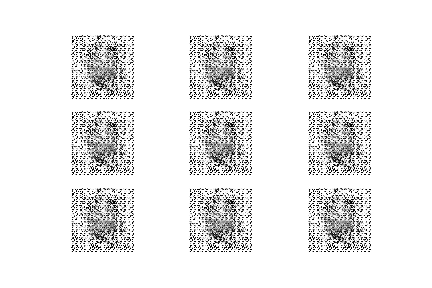

In [73]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

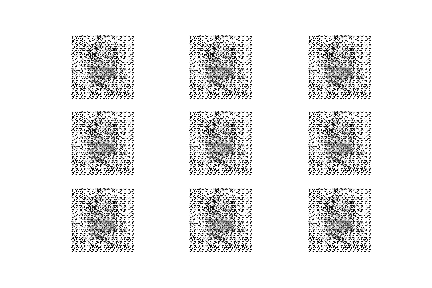

In [72]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

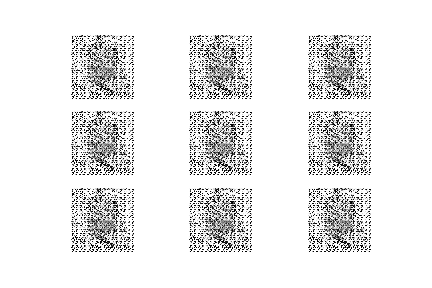

In [74]:
Image(filename=os.path.join(images_dir, 'mnist_150.png'))

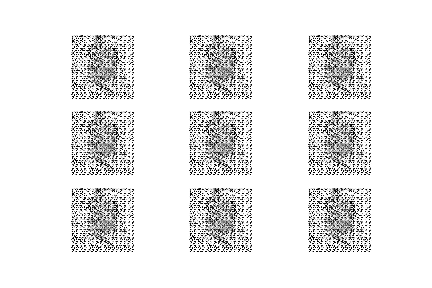

In [71]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

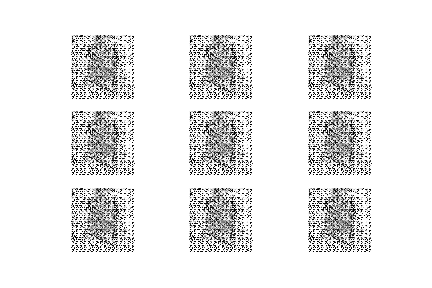

In [75]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

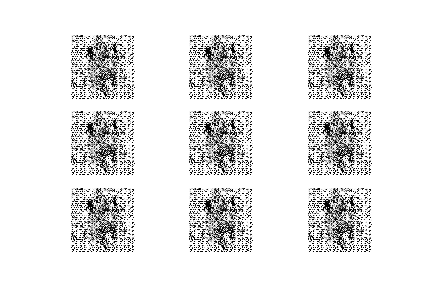

In [76]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

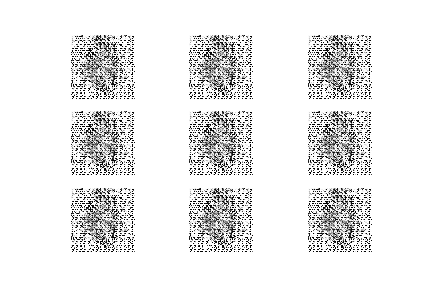

In [77]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

In [78]:
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=501, batch_size=32, save_interval=50)

0 [D loss: 0.055016886442899704, acc.: 100.00%] [G loss: 0.43742090463638306]
50 [D loss: 0.07283343002200127, acc.: 100.00%] [G loss: 0.5907618403434753]
100 [D loss: 0.05136209912598133, acc.: 100.00%] [G loss: 0.5570032596588135]
150 [D loss: 0.0731741338968277, acc.: 100.00%] [G loss: 0.6069847345352173]
200 [D loss: 0.2961610108613968, acc.: 100.00%] [G loss: 0.5637767314910889]
250 [D loss: 0.10066089779138565, acc.: 100.00%] [G loss: 0.47570356726646423]
300 [D loss: 0.0903057400137186, acc.: 100.00%] [G loss: 0.39525577425956726]
350 [D loss: 0.05754384025931358, acc.: 100.00%] [G loss: 0.6271191835403442]
400 [D loss: 0.06631390005350113, acc.: 100.00%] [G loss: 0.593563437461853]
450 [D loss: 0.0682564377784729, acc.: 100.00%] [G loss: 0.5322325229644775]
500 [D loss: 0.1467728391289711, acc.: 100.00%] [G loss: 0.6132000088691711]


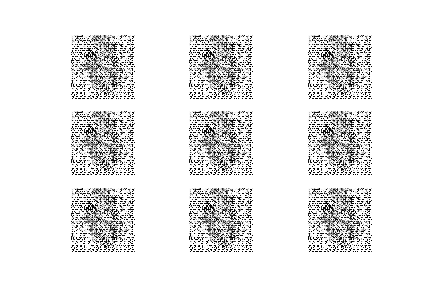

In [79]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

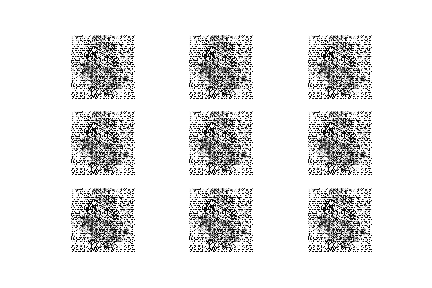

In [80]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

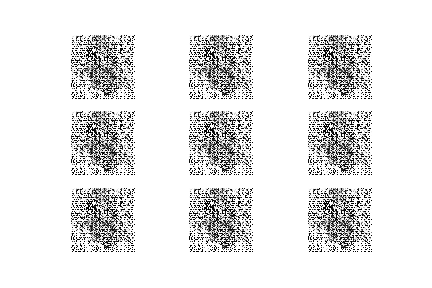

In [81]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

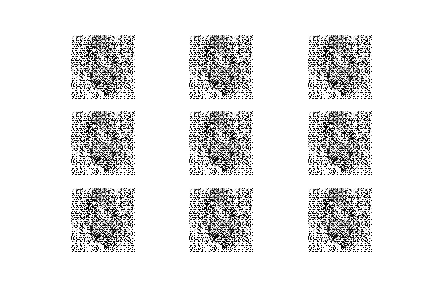

In [82]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

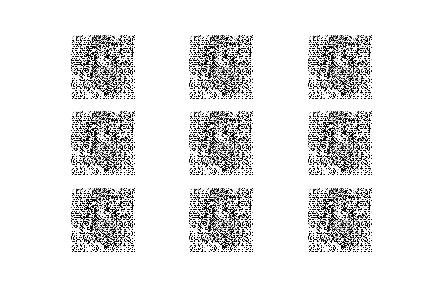

In [83]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

Predictably, not much more success. And so after 4500 epochs, I'm left with a QR code.

Here I tried adding a 2 stride Conv2DTranspose layer to see if that might help.

In [6]:
def build_discriminator():
    '''
    Put together a CNN that will return a single confidence output.
    
    returns: the model object
    '''

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

def build_generator():
    '''
    Put together a model that takes in one-dimensional noise and outputs two-dimensional
    data representing a black and white image, with -1 for black and 1 for white.
    
    returns: the model object
    '''

    noise_shape = (noise_len,)

    model = Sequential()

    model.add(Dense(256 * 8 * 8, activation="relu", input_shape=noise_shape))
    model.add(Reshape((8, 8, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=(1,1), padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    # This was where I added another deconv layer that upsamples the image (because of stride 2)
    # Additionally, the initial dense array shape had to be changed to have sides of 8 instead of 16
    model.add(Conv2DTranspose(128, kernel_size=4, strides=(2,2), padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(64, kernel_size=4, strides=(2,2), padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(1, kernel_size=4, strides=(2,2), padding="same"))
    model.add(Activation("tanh"))

    return model

def build_combined():
    '''
    Puts together a model that combines the discriminator and generator models.
    
    returns: the generator, discriminator, and combined model objects
    '''
    
    optimizer = Adam(0.0002, 0.5)

    # Build and compile the discriminator
    discriminator = build_discriminator()
    discriminator.compile(loss='binary_crossentropy', 
                          optimizer=optimizer,
                          metrics=['accuracy'])


    # Build and compile the generator
    generator = build_generator()

    # The generator takes noise as input and generates images
    noise = Input(shape=(noise_len,))
    img = generator(noise)
    
    # For the combined model we will only train the generator
    discriminator.trainable = False

    # The discriminator takes generated images as input and determines validity
    valid = discriminator(img)

    # The combined model  (stacked generator and discriminator) takes
    # noise as input => generates images => determines validity 
    combined = Model(inputs=noise, outputs=valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator, discriminator, combined

def save_imgs(generator, iteration):
    '''
    Has the generator create images and saves the images in a single file that includes
    the number of iterations in the filename.
    
    inputs:
        generator: the generator model object returned by build_combined
        iteration: the iteration number (but can be anything that can be represented as a string)
    
    returns: None
    '''
    r, c = 3, 3
    noise = np.random.normal(0, 1, (r * c, noise_len))
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray', vmin=-1, vmax=1)
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(images_dir, 'mnist_{}.png'.format(iteration)))
    plt.close()

def train(generator, discriminator, combined, dataset, iterations, batch_size=128, save_interval=50):
    '''
    Trains all model objects
    
    generator: the generator model object returned by build_combined
    discriminator: the discriminator model object returned by build_combined
    combined: the combined model object returned by build_combined
    iterations: integer, the number of iterations to train for
    batch_size: integer, the number of training samples to use at a time
    save_interval: integer, will generate and save images when the current iteration_num % save_interval is 0
    
    returns: None
    '''

    # Load the dataset
    #(X_train, _), (_, _) = mnist.load_data()
    # load mugshots here
    X_train = dataset


    # Rescale -1 to 1
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    half_batch = int(batch_size / 2)

    for iteration in range(iterations):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random half batch of images
        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

        # Sample noise and generate a half batch of new images
        noise = np.random.normal(0, 1, (half_batch, noise_len))
        gen_imgs = generator.predict(noise)

        # Train the discriminator (real images classified as ones and generated images as zeros)
        real = 1
        fake = 0
        # Use noisy labels: about 10% of the time, swap the labels
        # (see https://github.com/soumith/ganhacks)
        if np.random.randint(0, 10) < 1:
            real = 0
            fake = 1
        d_loss_real = discriminator.train_on_batch(imgs, np.zeros((half_batch, 1)) + real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)) + fake)

        # ---------------------
        #  Train Generator
        # ---------------------

        noise = np.random.normal(0, 1, (batch_size, noise_len))

        # Train the generator (wants discriminator to mistake images as real)
        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

        # If at save interval => save generated image samples and plot progress
        if iteration % save_interval == 0:
            # Plot the progress
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            print ("{} [D loss: {}, acc.: {:.2%}] [G loss: {}]".format(iteration, d_loss[0], d_loss[1], g_loss))
            save_imgs(generator, iteration)
            
def show_new_image(generator):
    '''
    Generates and displays a new image
    
    inputs: generator object model returned from build_combined
    
    returns: generated image
    '''
    
    noise = np.random.normal(0, 1, (1, noise_len))
    gen_img = generator.predict(noise)[0][:,:,0]
    
    return plt.imshow(gen_img, cmap='gray', vmin=-1, vmax=1)

In [44]:
generator, discriminator, combined = build_combined()

In [45]:
# Train using GPU acceleration
# (see https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=Y04m-jvKRDsJ)
device_name = test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
        '\n\nThis error most likely means that this notebook is not '
        'configured to use a GPU.  Change this in Notebook Settings via the '
        'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

# Lower the number of iterations when you start debugging! You want a short testing cycle until you are confident
# that the code is working. Also, since the exercises involve models with less complicated patterns, you will
# likely not need as many iterations to train well.
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots, iterations=1001, batch_size=32, save_interval=50)

0 [D loss: 1.3974907994270325, acc.: 9.38%] [G loss: 0.7269291877746582]
50 [D loss: 0.547481968998909, acc.: 75.00%] [G loss: 2.5542049407958984]
100 [D loss: 0.6363118290901184, acc.: 59.38%] [G loss: 0.7471623420715332]
150 [D loss: 0.11599548906087875, acc.: 100.00%] [G loss: 1.836632490158081]
200 [D loss: 0.06419162452220917, acc.: 100.00%] [G loss: 1.1180734634399414]
250 [D loss: 0.8508050739765167, acc.: 53.12%] [G loss: 0.6464933156967163]
300 [D loss: 0.04603574238717556, acc.: 100.00%] [G loss: 1.35235595703125]
350 [D loss: 0.08308656513690948, acc.: 100.00%] [G loss: 1.7895197868347168]
400 [D loss: 0.01300617540255189, acc.: 100.00%] [G loss: 1.1286665201187134]
450 [D loss: 0.0514366514980793, acc.: 100.00%] [G loss: 0.5336006283760071]
500 [D loss: 0.017171002458781004, acc.: 100.00%] [G loss: 0.2875472605228424]
550 [D loss: 0.03859768249094486, acc.: 100.00%] [G loss: 0.15889698266983032]
600 [D loss: 0.023383013904094696, acc.: 100.00%] [G loss: 0.2933914065361023]


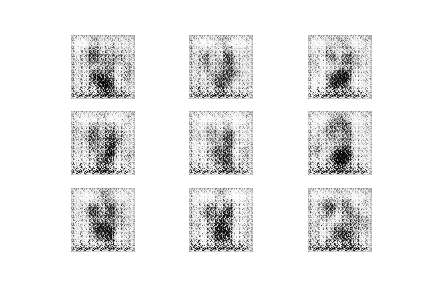

In [46]:
Image(filename=os.path.join(images_dir, 'mnist_50.png'))

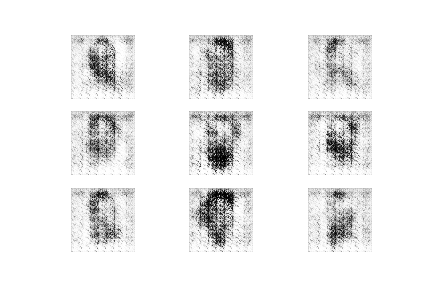

In [47]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

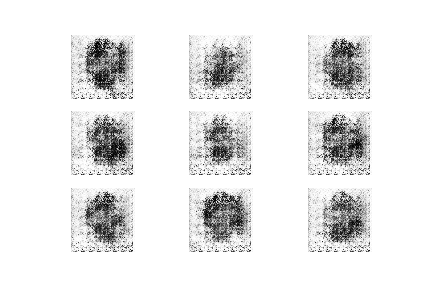

In [48]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

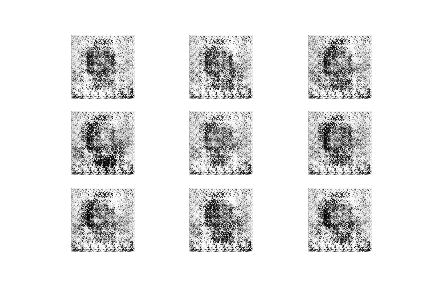

In [49]:
Image(filename=os.path.join(images_dir, 'mnist_250.png'))

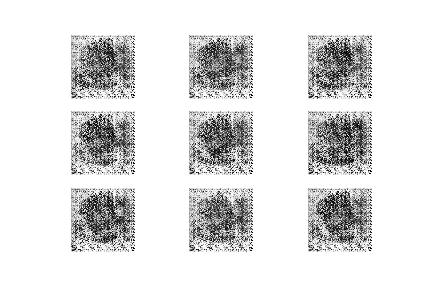

In [50]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

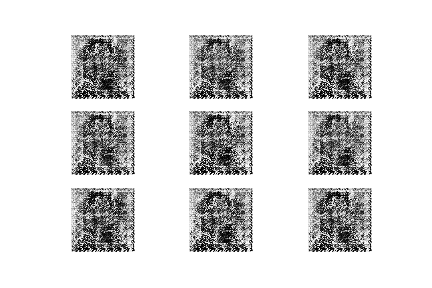

In [51]:
Image(filename=os.path.join(images_dir, 'mnist_350.png'))

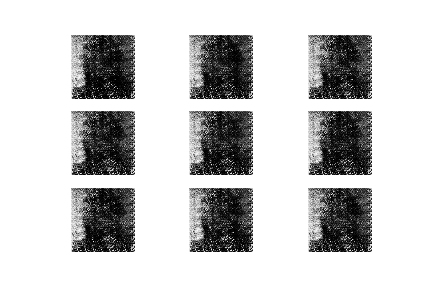

In [52]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

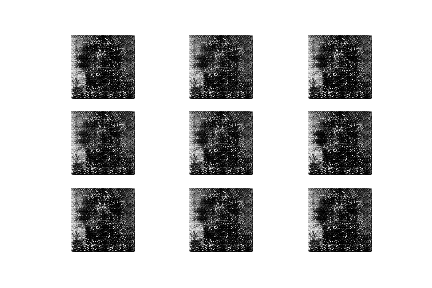

In [53]:
Image(filename=os.path.join(images_dir, 'mnist_450.png'))

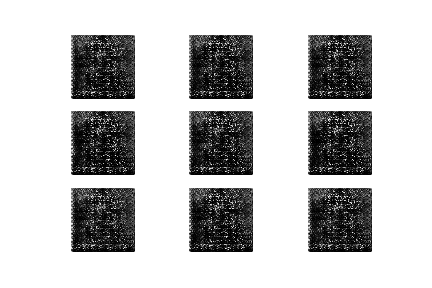

In [54]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

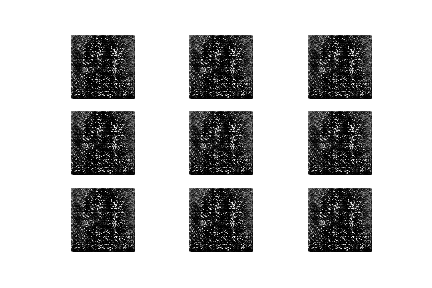

In [55]:
Image(filename=os.path.join(images_dir, 'mnist_600.png'))

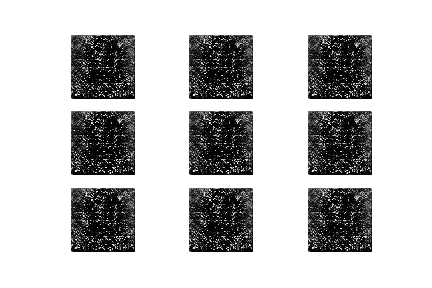

In [56]:
Image(filename=os.path.join(images_dir, 'mnist_700.png'))

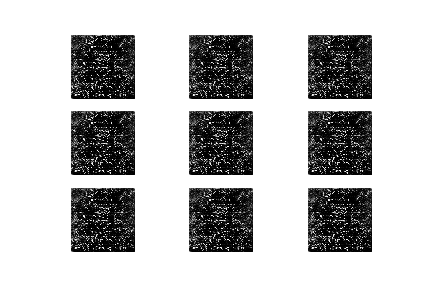

In [57]:
Image(filename=os.path.join(images_dir, 'mnist_800.png'))

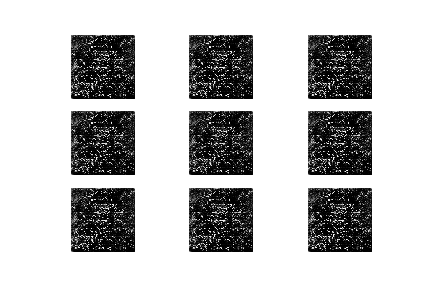

In [58]:
Image(filename=os.path.join(images_dir, 'mnist_850.png'))

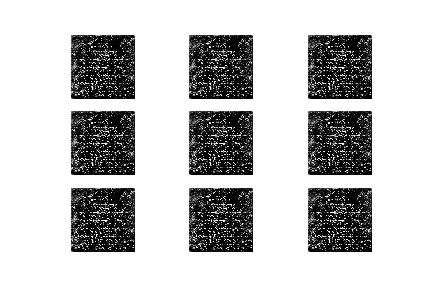

In [59]:
Image(filename=os.path.join(images_dir, 'mnist_900.png'))

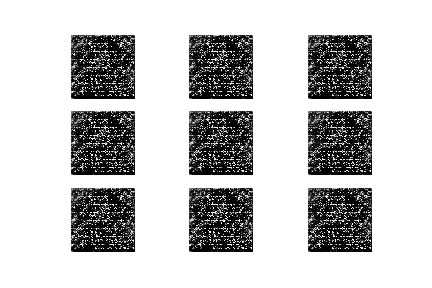

In [60]:
Image(filename=os.path.join(images_dir, 'mnist_1000.png'))

I actually initially have some success, and the faces start taking shape on the screen, but somewhere between epochs 250 and 300, the model decided to go haywire, and in the end we get a black image.

Below is my last ditch attempt at a model. I thought that 64x64 mugshots might be to complex, so I tried running the same model but with the images scaled down to 32x32 pixels. Here I checked the images and converted them to 32x32, with the help of this [PIL documentation](https://pillow.readthedocs.io/en/stable/reference/Image.html).

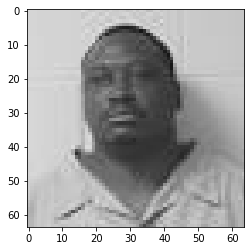

In [72]:
plt.imshow(mugshots[4800], cmap='gray', vmin=0, vmax=255)

In [66]:
mugshots[1]

array([[197, 197, 197, ..., 187, 187, 187],
       [197, 197, 197, ..., 186, 187, 187],
       [197, 197, 197, ..., 186, 186, 187],
       ...,
       [173, 184, 170, ..., 178, 176, 181],
       [168, 185, 172, ..., 178, 174, 177],
       [164, 185, 172, ..., 178, 173, 175]], dtype=uint8)

In [75]:
from PIL import Image as pilmage

mugshots_small = []
for a in mugshots:
    im = pilmage.fromarray(a)
    im = im.resize((32,32))
    mugshots_small.append(np.asarray(im))
mugshots_small = np.array(mugshots_small)

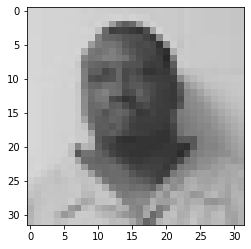

In [77]:
plt.imshow(mugshots_small[4800], cmap='gray', vmin=0, vmax=255)

In [78]:
img_rows = 32
img_cols = 32
channels = 1
img_shape = (img_rows, img_cols, channels)

size = 32, 32

noise_len = 100

In [79]:
def build_discriminator():
    '''
    Put together a CNN that will return a single confidence output.
    
    returns: the model object
    '''

    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=img_shape, padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

def build_generator():
    '''
    Put together a model that takes in one-dimensional noise and outputs two-dimensional
    data representing a black and white image, with -1 for black and 1 for white.
    
    returns: the model object
    '''

    noise_shape = (noise_len,)

    model = Sequential()

    # This had to be changed from 8 to 4 because of the smaller final images
    model.add(Dense(256 * 4 * 4, activation="relu", input_shape=noise_shape))
    model.add(Reshape((4, 4, 256)))
    model.add(Conv2DTranspose(128, kernel_size=3, strides=(1,1), padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(128, kernel_size=4, strides=(2,2), padding="same"))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(64, kernel_size=4, strides=(2,2), padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(1, kernel_size=4, strides=(2,2), padding="same"))
    model.add(Activation("tanh"))

    return model

def build_combined():
    '''
    Puts together a model that combines the discriminator and generator models.
    
    returns: the generator, discriminator, and combined model objects
    '''
    
    optimizer = Adam(0.0002, 0.5)

    # Build and compile the discriminator
    discriminator = build_discriminator()
    discriminator.compile(loss='binary_crossentropy', 
                          optimizer=optimizer,
                          metrics=['accuracy'])


    # Build and compile the generator
    generator = build_generator()

    # The generator takes noise as input and generates images
    noise = Input(shape=(noise_len,))
    img = generator(noise)
    
    # For the combined model we will only train the generator
    discriminator.trainable = False

    # The discriminator takes generated images as input and determines validity
    valid = discriminator(img)

    # The combined model  (stacked generator and discriminator) takes
    # noise as input => generates images => determines validity 
    combined = Model(inputs=noise, outputs=valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator, discriminator, combined

def save_imgs(generator, iteration):
    '''
    Has the generator create images and saves the images in a single file that includes
    the number of iterations in the filename.
    
    inputs:
        generator: the generator model object returned by build_combined
        iteration: the iteration number (but can be anything that can be represented as a string)
    
    returns: None
    '''
    r, c = 3, 3
    noise = np.random.normal(0, 1, (r * c, noise_len))
    gen_imgs = generator.predict(noise)

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray', vmin=-1, vmax=1)
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(images_dir, 'mnist_{}.png'.format(iteration)))
    plt.close()

def train(generator, discriminator, combined, dataset, iterations, batch_size=128, save_interval=50):
    '''
    Trains all model objects
    
    generator: the generator model object returned by build_combined
    discriminator: the discriminator model object returned by build_combined
    combined: the combined model object returned by build_combined
    iterations: integer, the number of iterations to train for
    batch_size: integer, the number of training samples to use at a time
    save_interval: integer, will generate and save images when the current iteration_num % save_interval is 0
    
    returns: None
    '''

    # Load the dataset
    #(X_train, _), (_, _) = mnist.load_data()
    # load mugshots here
    X_train = dataset


    # Rescale -1 to 1
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    half_batch = int(batch_size / 2)

    for iteration in range(iterations):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random half batch of images
        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

        # Sample noise and generate a half batch of new images
        noise = np.random.normal(0, 1, (half_batch, noise_len))
        gen_imgs = generator.predict(noise)

        # Train the discriminator (real images classified as ones and generated images as zeros)
        real = 1
        fake = 0
        # Use noisy labels: about 10% of the time, swap the labels
        # (see https://github.com/soumith/ganhacks)
        if np.random.randint(0, 10) < 1:
            real = 0
            fake = 1
        d_loss_real = discriminator.train_on_batch(imgs, np.zeros((half_batch, 1)) + real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)) + fake)

        # ---------------------
        #  Train Generator
        # ---------------------

        noise = np.random.normal(0, 1, (batch_size, noise_len))

        # Train the generator (wants discriminator to mistake images as real)
        g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

        # If at save interval => save generated image samples and plot progress
        if iteration % save_interval == 0:
            # Plot the progress
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            print ("{} [D loss: {}, acc.: {:.2%}] [G loss: {}]".format(iteration, d_loss[0], d_loss[1], g_loss))
            save_imgs(generator, iteration)
            
def show_new_image(generator):
    '''
    Generates and displays a new image
    
    inputs: generator object model returned from build_combined
    
    returns: generated image
    '''
    
    noise = np.random.normal(0, 1, (1, noise_len))
    gen_img = generator.predict(noise)[0][:,:,0]
    
    return plt.imshow(gen_img, cmap='gray', vmin=-1, vmax=1)

In [96]:
generator, discriminator, combined = build_combined()

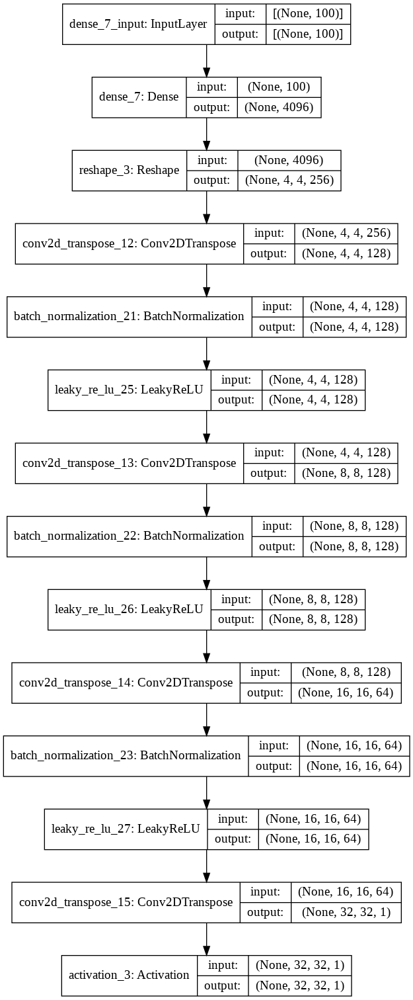

In [81]:
plot_model(generator, show_shapes=True)

In [82]:
generator.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape_3 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_12 (Conv2DT (None, 4, 4, 128)         295040    
_________________________________________________________________
batch_normalization_21 (Batc (None, 4, 4, 128)         512       
_________________________________________________________________
leaky_re_lu_25 (LeakyReLU)   (None, 4, 4, 128)         0         
_________________________________________________________________
conv2d_transpose_13 (Conv2DT (None, 8, 8, 128)         262272    
_________________________________________________________________
batch_normalization_22 (Batc (None, 8, 8, 128)        

In [83]:
discriminator.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 16, 16, 32)        320       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 8, 8, 64)          18496     
_________________________________________________________________
zero_padding2d_3 (ZeroPaddin (None, 9, 9, 64)          0         
_________________________________________________________________
batch_normalization_18 (Batc (None, 9, 9, 64)          256       
_________________________________________________________________
leaky_re_lu_22 (LeakyReLU)   (None, 9, 9, 64)         

In [84]:
combined.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential_7 (Sequential)    (None, 32, 32, 1)         1104449   
_________________________________________________________________
sequential_6 (Sequential)    (None, 1)                 396033    
Total params: 1,500,482
Trainable params: 1,103,809
Non-trainable params: 396,673
_________________________________________________________________


In [108]:
# Train using GPU acceleration
# (see https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=Y04m-jvKRDsJ)
device_name = test.gpu_device_name()
if device_name != '/device:GPU:0':
    print(
        '\n\nThis error most likely means that this notebook is not '
        'configured to use a GPU.  Change this in Notebook Settings via the '
        'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
    raise SystemError('GPU device not found')

# Lower the number of iterations when you start debugging! You want a short testing cycle until you are confident
# that the code is working. Also, since the exercises involve models with less complicated patterns, you will
# likely not need as many iterations to train well.
with device('/device:GPU:0'):
    train(generator, discriminator, combined, mugshots_small, iterations=1001, batch_size=32, save_interval=50)

0 [D loss: 0.22218861430883408, acc.: 96.88%] [G loss: 0.3913806676864624]
50 [D loss: 0.6772738695144653, acc.: 59.38%] [G loss: 0.09317752718925476]
100 [D loss: 0.10254253447055817, acc.: 100.00%] [G loss: 0.3829776346683502]
150 [D loss: 0.08705623634159565, acc.: 100.00%] [G loss: 0.47932249307632446]
200 [D loss: 0.10704515874385834, acc.: 100.00%] [G loss: 0.09741416573524475]
250 [D loss: 0.10980776697397232, acc.: 100.00%] [G loss: 0.41667401790618896]
300 [D loss: 0.24442514777183533, acc.: 96.88%] [G loss: 0.3066731095314026]
350 [D loss: 0.0968414805829525, acc.: 100.00%] [G loss: 0.4414920210838318]
400 [D loss: 0.06290778145194054, acc.: 100.00%] [G loss: 0.4897724390029907]
450 [D loss: 0.3039020895957947, acc.: 100.00%] [G loss: 0.0681457370519638]
500 [D loss: 0.056899258866906166, acc.: 100.00%] [G loss: 0.4199606776237488]
550 [D loss: 0.062262121587991714, acc.: 100.00%] [G loss: 0.34337422251701355]
600 [D loss: 0.18390898406505585, acc.: 100.00%] [G loss: 0.118603

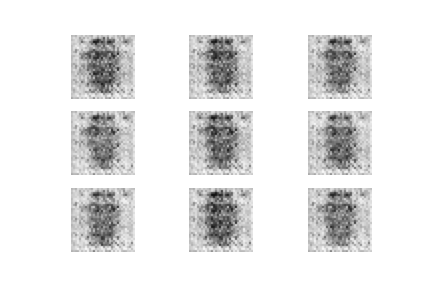

In [98]:
Image(filename=os.path.join(images_dir, 'mnist_100.png'))

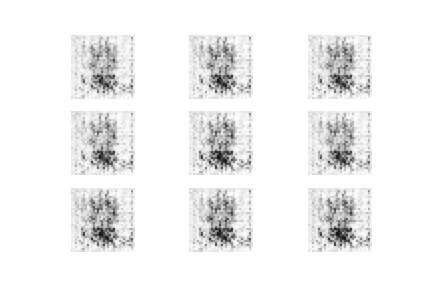

In [99]:
Image(filename=os.path.join(images_dir, 'mnist_200.png'))

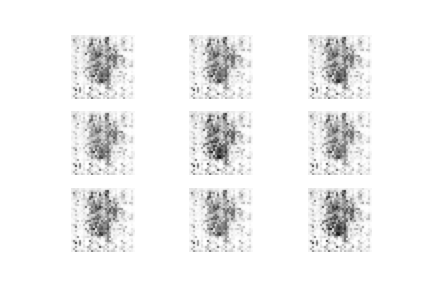

In [100]:
Image(filename=os.path.join(images_dir, 'mnist_300.png'))

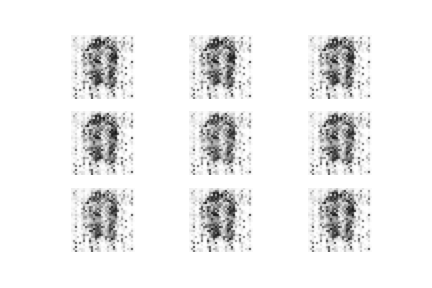

In [101]:
Image(filename=os.path.join(images_dir, 'mnist_400.png'))

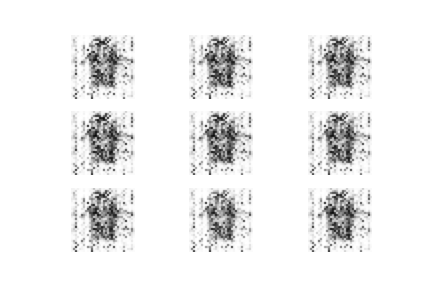

In [102]:
Image(filename=os.path.join(images_dir, 'mnist_500.png'))

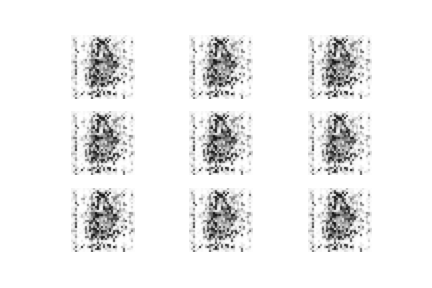

In [103]:
Image(filename=os.path.join(images_dir, 'mnist_600.png'))

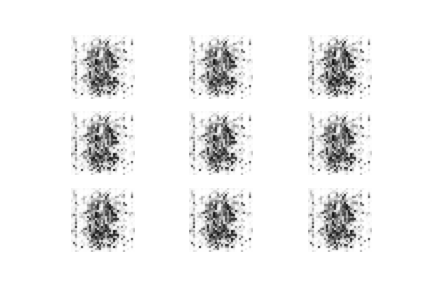

In [104]:
Image(filename=os.path.join(images_dir, 'mnist_700.png'))

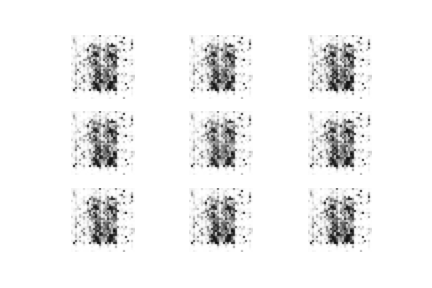

In [105]:
Image(filename=os.path.join(images_dir, 'mnist_800.png'))

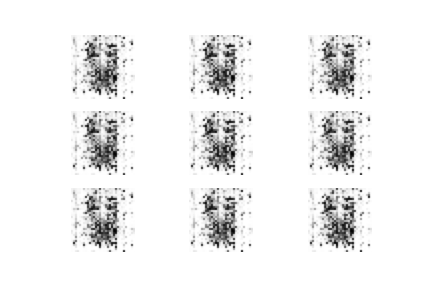

In [106]:
Image(filename=os.path.join(images_dir, 'mnist_900.png'))

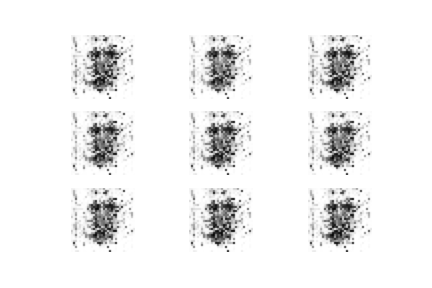

In [107]:
Image(filename=os.path.join(images_dir, 'mnist_1000.png'))

This honestly went pretty well. Aside from the random black pixels, the shape of the face really comes out, and even the neckline of the t-shirts shows up.

Overall, what surprised me most after trying all these models was how by the end I still didn't have mugshot looking images, while the articles I looked at had models cranking out great generated images. Maybe I'm missing something. Please let me know what you think. I want to get to the bottom of this.